# FPS Benchmark

## Descripción del conjunto de datos y su fuente

Una pequeña descripción del conjunto de datos y su fuente. Debe incluir cuál será su variable
objetivo y si resolverá un problema de regresión o clasificación. También se deben comentar
problemas específicos de los datos, como atributos relacionados con el tiempo y desbalance
entre clases.

Después de dedicar un tiempo a buscar un dataset que cumpliera con las condiciones establecidas por el enunciado, hemos encontrado uno en Kaggle: https://www.kaggle.com/datasets/ulrikthygepedersen/fps-benchmark. El dataset contiene mediciones reales de FPS de videojuegos modernos ejecutados en distintos ordenadores. Cada fila describe varios atributos del hardware del ordenador, así como caracteristicas relacionadas con las configuraciones de resolución del videojuego. Un ordenador se caracteriza por detalles de su CPU y GPU. Los FPS son entonces la variable objetivo, y al ser continua, estamos ante un problema de **regresión**.

En nuestro datset tenemos una combinación de variables numéricas y categóricas, que suman un total de 43 variables, sin contar la variable objetivo. Como ya hemos mencionado, los datos no son sintéticos. De hecho, vamos a necesitar algun tipo de preprocesamiento ya que, por ejemplo, tenemos varias variables con valores perdidos. Luego, el dataset tiene un total de 24624 muestras, que supera por bastante la condición de tener almenos 500. Después de haber estado buscando, no hemos encontrado el problema resuelto en internet, es decir, no es uno de los problemas simples usados habitualmente como ejemplos. Además, a continuación mostraremos que el problema es suficientemente complejo, ajustando una regresión lineal y viendo como el acierto es muy bajo.


Pero antes de nada, **¿porqué hemos escogido este problema?**

Bien, a parte que el dataset cumple con todas las condiones del enunciado, nos parece un tema muy interesante el intentar predecir los FPS que vamos a obtener en base a las características de nuestro hardware y la resolución que queremos. Muchas veces, cuando uno quiere comprar una nueva CPU o GPU de cara a tener una mejor experiencia en un juego, mira videos de gente probando el videojuego con ese hardware concreto, de cara a ver un aproximado de los FPS que obtendria. Si llegamos a obtener un buen modelo en este problema, no seria necesaria la ejecución de cara a saber de forma aproximada los FPS que obtendríamos.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import re

from sklearn.model_selection import train_test_split,  KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from yellowbrick.regressor import residuals_plot
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from skopt import BayesSearchCV


from sklearn import set_config

from yellowbrick.regressor import AlphaSelection, prediction_error

from statsmodels.genmod.generalized_linear_model import GLM
import statsmodels.api as sm
from scipy import stats
from IPython.display import display, HTML
show_html = lambda html: display(HTML(html))


import warnings

set_config(display='text')
warnings.filterwarnings('ignore')

sns.set()
pd.set_option('display.precision', 3)

## Carga de los datos

In [ ]:
fps_df = pd.read_csv('fps_benchmark.csv')

Antes de nada, modificamos los caracteres que nos puedan dar problemas y movemos la columna objetivo de forma que sea la primera.

In [ ]:
fps_df.columns = [c.lower().strip().replace(' ','_').replace('/','_').replace('-','_')
                                for c in fps_df.columns]

categorical_columns = list(fps_df.dtypes[fps_df.dtypes == 'O'].index.values)
for column in categorical_columns:
    fps_df[column] = fps_df[column].astype('category')

cols = list(fps_df.columns)
cols.remove("fps")
cols.insert(0, "fps")
fps_df_no_categ = fps_df.reindex(columns=cols)

## Análisis inicial de los datos

En este apartado pretendemos analizar un poco nuestros datos, de forma que conozcamos bien nuestros datos y podamos hacer un buen preprocesado.

Visualizamos los primeros valores del dataset para ver de que tipos son y que magnitudes tienen. Podemos ver ya inicialmente que tenemos ciertos atributos categóricos, de forma que deberemos codificarlos mas adelante.

In [ ]:
fps_df.head()

,cpuname,cpunumberofcores,cpunumberofthreads,cpubaseclock,cpucachel1,cpucachel2,cpucachel3,cpudiesize,cpufrequency,cpumultiplier,...,gpushadermodel,gpunumberofshadingunits,gpunumberoftmus,gputexturerate,gpunumberoftransistors,gpuvulkan,gamename,gameresolution,gamesetting,fps
0,b'Intel Core i9-9900K',8.0,16.0,100.0,512.0,2048.0,16.0,NaN,3600.0,36.0,...,b'6.5',4352.0,272.0,420200.0,18600.0,b'1.2.131',b'callOfDutyWW2',1080.0,b'med',225.3
1,b'Intel Core i7-9700K',8.0,8.0,100.0,512.0,2048.0,12.0,NaN,3600.0,36.0,...,b'6.5',4352.0,272.0,420200.0,18600.0,b'1.2.131',b'callOfDutyWW2',1080.0,b'med',223.3
2,b'Intel Core i7-8700K',6.0,12.0,100.0,384.0,1536.0,12.0,NaN,3700.0,37.0,...,b'6.5',4352.0,272.0,420200.0,18600.0,b'1.2.131',b'callOfDutyWW2',1080.0,b'med',207.3
3,b'Intel Core i7-7700K',4.0,8.0,100.0,256.0,1024.0,8.0,NaN,4200.0,42.0,...,b'6.5',4352.0,272.0,420200.0,18600.0,b'1.2.131',b'callOfDutyWW2',1080.0,b'med',201.3
4,b'Intel Core i5-9400F',6.0,6.0,100.0,384.0,1536.0,9.0,NaN,2900.0,29.0,...,b'6.5',4352.0,272.0,420200.0,18600.0,b'1.2.131',b'callOfDutyWW2',1080.0,b'med',199.2


Vemos que las variables categoricas estan en formato bytearray así que mediante expresiones regulares haremos una transformacion para quitarle el formato byte:

In [ ]:
fps_df['gpuvulkan'].value_counts()

gpuvulkan
b'1.2.131'    20064
b'1.1.126'     3648
b'1.1.125'      912
Name: count, dtype: int64

In [ ]:
categorical_columns = fps_df.select_dtypes(include=['category']).columns

for col in categorical_columns:
    fps_df[col] = fps_df[col].apply(lambda x: re.sub(r"^b'(.*)'$", r'\1', x))

In [ ]:
fps_df['gpuvulkan'].value_counts()

gpuvulkan
1.2.131    20064
1.1.126     3648
1.1.125      912
Name: count, dtype: int64

In [ ]:
print(f"\nTenemos {fps_df.shape[1] - 1} features en nuestro datset")
print(f"El numero de ejemplos es: {fps_df.shape[0]}\n")

fps_df.describe()


Tenemos 43 features en nuestro datset
El numero de ejemplos es: 24624



,cpunumberofcores,cpunumberofthreads,cpubaseclock,cpucachel1,cpucachel2,cpucachel3,cpudiesize,cpufrequency,cpumultiplier,cpuprocesssize,...,gpumemorysize,gpupixelrate,gpuprocesssize,gpunumberofrops,gpunumberofshadingunits,gpunumberoftmus,gputexturerate,gpunumberoftransistors,gameresolution,fps
count,24624.000,24624.000,24624.0,24624.000,24624.000,24624.000,1.166e+04,24624.000,24624.000,24624.000,...,24624.000,24624.000,24624.000,24624.000,24624.000,24624.000,24624.000,24624.000,24624.0,24624.000
mean,6.316,10.842,100.0,515.368,2506.105,18.211,1.264e-04,3589.474,35.895,11.947,...,7333.333,89045.926,15.259,57.778,2237.630,139.852,215336.296,8377.778,1080.0,123.959
std,2.079,5.204,0.0,233.522,1398.698,14.230,5.864e-05,317.720,3.177,3.017,...,2775.611,28211.658,5.784,19.023,866.316,54.145,83501.933,3533.754,0.0,54.610
min,2.000,4.000,100.0,128.000,512.000,3.000,7.400e-05,2800.000,28.000,7.000,...,3000.000,36430.000,7.000,24.000,768.000,48.000,66820.000,3300.000,1080.0,22.200
25%,6.000,6.000,100.0,384.000,1536.000,9.000,7.400e-05,3400.000,34.000,7.000,...,6000.000,68360.000,12.000,48.000,1536.000,96.000,157100.000,5700.000,1080.0,83.600
50%,6.000,12.000,100.0,512.000,2048.000,16.000,7.400e-05,3600.000,36.000,14.000,...,8000.000,86400.000,14.000,64.000,2304.000,144.000,202000.000,7200.000,1080.0,114.300
75%,8.000,16.000,100.0,576.000,3072.000,32.000,1.920e-04,3800.000,38.000,14.000,...,8000.000,109400.000,16.000,64.000,2560.000,160.000,277300.000,10800.000,1080.0,154.100
max,12.000,24.000,100.0,1152.000,6144.000,64.000,1.920e-04,4200.000,42.000,14.000,...,16000.000,139200.000,28.000,96.000,4352.000,272.000,420200.000,18600.000,1080.0,396.400


Visualizamos el tipo de las variables y si contienen valores nulos o no:

In [ ]:
fps_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24624 entries, 0 to 24623
Data columns (total 44 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   cpuname                    24624 non-null  category
 1   cpunumberofcores           24624 non-null  float64 
 2   cpunumberofthreads         24624 non-null  float64 
 3   cpubaseclock               24624 non-null  float64 
 4   cpucachel1                 24624 non-null  float64 
 5   cpucachel2                 24624 non-null  float64 
 6   cpucachel3                 24624 non-null  float64 
 7   cpudiesize                 11664 non-null  float64 
 8   cpufrequency               24624 non-null  float64 
 9   cpumultiplier              24624 non-null  float64 
 10  cpumultiplierunlocked      24624 non-null  category
 11  cpuprocesssize             24624 non-null  float64 
 12  cputdp                     24624 non-null  float64 
 13  cpunumberoftransistors     1166

Vemos como la mayoria de variables son numéricas, sin embargo hay unas pocas categóricas que habrá que tratar mas adelante.

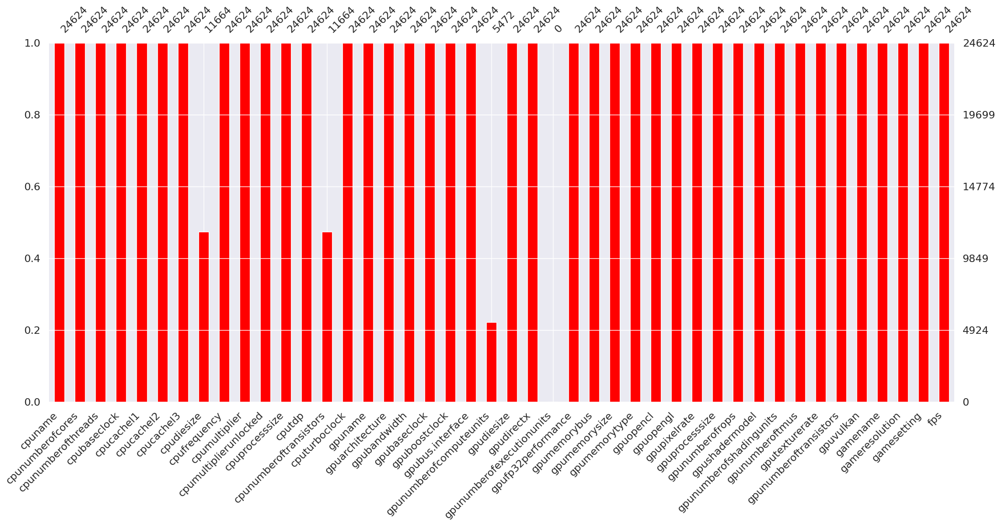

In [ ]:
plt.figure(figsize=(20,5))
msno.bar(fps_df, color="red")
plt.show()

En la gráfica anterior se observa como la mayoria de atributos no tienen valores faltantes, sin embargo hay 4 que sí, uno de los cuales tiene el 100% de valores faltantes. Mas adelante se verá como hemos tratado este problema.

Procedemos a ver un poco que distribuciones hay en cada variable. Para las variables numéricas usamos histogramas, y para las categóricas usamos barplots:

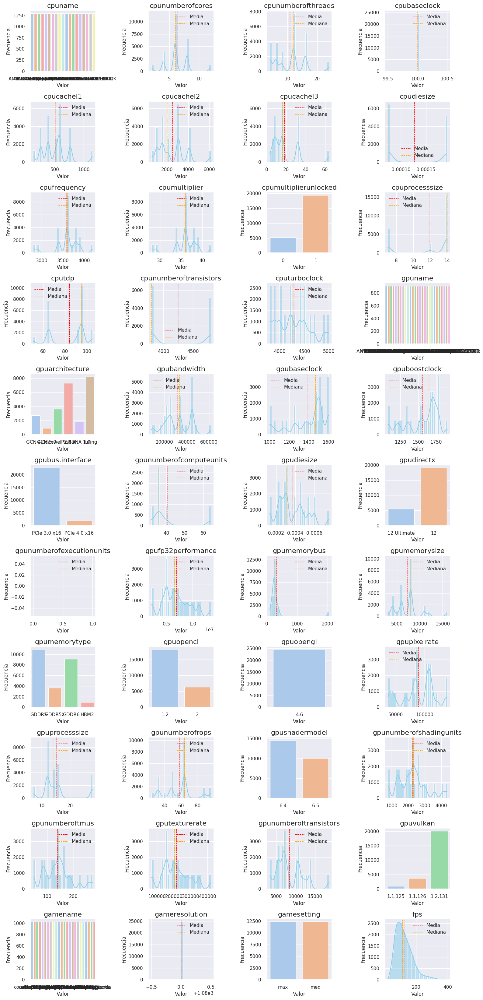

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Usamos un calculo dinámico de la grid para no hacer nada hard-coded
n_features = len(fps_df.columns)
n_cols = 4
n_rows = math.ceil(n_features / n_cols)


fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3))
axes = axes.flatten()

for i, c in enumerate(fps_df.columns):
    ax = axes[i]

    if fps_df[c].dtype in ['float64']:
        sns.histplot(data=fps_df, x=c, ax=ax, bins=30, kde=True, color='skyblue')
        mean = fps_df[c].mean()
        median = fps_df[c].median()
        ax.axvline(mean, color='red', linestyle='dashed', linewidth=1, label='Media')
        ax.axvline(median, color='orange', linestyle='dashed', linewidth=1, label='Mediana')
        ax.legend()
    elif fps_df[c].dtype.name == 'category':
        sns.countplot(data=fps_df, x=c, ax=ax, palette='pastel')

    ax.set_title(c, fontsize=16)
    ax.set_xlabel('Valor', fontsize=12)
    ax.set_ylabel('Frecuencia', fontsize=12)

# Ocultamos los subplots vacíos si hay más espacios que columnas
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


Vemos como la mayoría de variables numéricas no siguen una distribucion normal dado que la mayoria hacen referencia a especificaciones de hardware que tienen valores fijos normalmente potencias de 2 o numeros pares, por ejemplo el numero de cores o threads. Es decir, muchas de nuestras variables numericas tienen realmente un rango discreto de posibilidades. En cambio, la variable objetivo (FPS) sigue una distribución casi normal. En cuanto a las variables categóricas, cabe destacar que hay prácticamente el mismo numero de ejemplos por juego, gpu, cpu y game_setting. Respecto las demas variables categóricas, la distribución es un poco mas desbalanceada.

## Preprocesado

Ahora que ya hemos visto un poco como son nuestros datos, vamos a preprocesarlos de cara a poder entrenar modelos posteriormente. En resumen, lo que debemos hacer es:
- Tratar valores faltantes
- Codificar variables categóricas
- Tratar posibles outliers
- Normalizar las variables

Como que tenemos que aplicar el mismo tratamiento a la partición de train y a la de test, hacemos el preprocesado directamente sobre el dataset original, y posteriormente realizamos la partición.

### Tratamiento de valores faltantes

Antes de nada, vamos a revisar las columnas con missing values y el porcentaje de valores faltantes en cuestión

In [ ]:
missing_values = fps_df.isnull().mean() * 100;
missing_values = missing_values[missing_values > 0];
missing_values = missing_values.sort_values(ascending=False);

missing_values_formatted = missing_values.apply(lambda x: f"{x:.2f}%");

print("Columnas con valores faltantes y su porcentaje:");
print(missing_values_formatted.to_string());

Columnas con valores faltantes y su porcentaje:
gpunumberofexecutionunits    100.00%
gpunumberofcomputeunits       77.78%
cpudiesize                    52.63%
cpunumberoftransistors        52.63%


Vemos como tenemos solo 4 atributos con valores faltantes. De hecho, uno tiene el 100% de missing values. Dado que los porcentajes de valores faltantes son elevados (superiores al 50%) imputar sus valores podria introducir ruido o sesgos en nuestros modelos al basarse en suposiciones o datos incompletos. Por este motivo hemos decidido eliminar las variables.

In [ ]:
# Eliminamos columnas con valores faltantes
fps_df_no_missing = fps_df.dropna(axis=1)

# Vemos las nuevas columnas para confirmar la eliminación
print(fps_df_no_missing.columns)

Index(['cpuname', 'cpunumberofcores', 'cpunumberofthreads', 'cpubaseclock',
       'cpucachel1', 'cpucachel2', 'cpucachel3', 'cpufrequency',
       'cpumultiplier', 'cpumultiplierunlocked', 'cpuprocesssize', 'cputdp',
       'cputurboclock', 'gpuname', 'gpuarchitecture', 'gpubandwidth',
       'gpubaseclock', 'gpuboostclock', 'gpubus.interface', 'gpudiesize',
       'gpudirectx', 'gpufp32performance', 'gpumemorybus', 'gpumemorysize',
       'gpumemorytype', 'gpuopencl', 'gpuopengl', 'gpupixelrate',
       'gpuprocesssize', 'gpunumberofrops', 'gpushadermodel',
       'gpunumberofshadingunits', 'gpunumberoftmus', 'gputexturerate',
       'gpunumberoftransistors', 'gpuvulkan', 'gamename', 'gameresolution',
       'gamesetting', 'fps'],
      dtype='object')


### Codificación de variables categóricas

Ahora vamos a tratar de codificar nuestras variables categóricas, ya que el objetivo final es quedarnos con únicamente variables numéricas. Vamos a empezar viendo una lista de nuestras variables categóricas y las posibles categorias que tienen:

In [ ]:
categorical_columns = fps_df_no_missing.select_dtypes(include=['category']).columns
categorical_info = {col: fps_df_no_missing[col].nunique() for col in categorical_columns}

for col, num_categories in categorical_info.items():
    print(f"Columna: {col} - Total de categorías: {num_categories}")

Columna: cpuname - Total de categorías: 19
Columna: cpumultiplierunlocked - Total de categorías: 2
Columna: gpuname - Total de categorías: 27
Columna: gpuarchitecture - Total de categorías: 6
Columna: gpubus.interface - Total de categorías: 2
Columna: gpudirectx - Total de categorías: 2
Columna: gpumemorytype - Total de categorías: 4
Columna: gpuopencl - Total de categorías: 2
Columna: gpuopengl - Total de categorías: 1
Columna: gpushadermodel - Total de categorías: 2
Columna: gpuvulkan - Total de categorías: 3
Columna: gamename - Total de categorías: 24
Columna: gamesetting - Total de categorías: 2


Inicialmente, vemos como hay varias variables categóricas binarias, y después de pensarlo hemos decidido que lo mejor es convertirlas a numéricas pasando las dos categorias a 0 y 1.

In [ ]:
fps_df_no_categ = fps_df_no_missing.copy()

# Identificamos las categoricas binarias (2 categorias posibles)
binary_categorical_columns = [col for col, num_categories in categorical_info.items() if num_categories == 2]

# Convertimos las columnas categóricas binarias a valores numéricos (0 y 1) de forma automatica
for col in binary_categorical_columns:
    unique_vals = fps_df_no_categ[col].unique()
    mapping = {unique_vals[0]: 0, unique_vals[1]: 1}
    fps_df_no_categ[col] = fps_df_no_categ[col].map(mapping)

# El tipo pasa a ser float
fps_df_no_categ[binary_categorical_columns] = fps_df_no_categ[binary_categorical_columns].astype(float)


print("Valores únicos de las categóricas binarias después de la conversión:")
for col in binary_categorical_columns:
    print(f"Columna: {col} - Valores únicos: {fps_df_no_categ[col].unique()}")

# Verificamos los tipos
print("\nTipos:")
print(fps_df_no_categ[binary_categorical_columns].dtypes)

Valores únicos de las categóricas binarias después de la conversión:
Columna: cpumultiplierunlocked - Valores únicos: [0. 1.]
Columna: gpubus.interface - Valores únicos: [0. 1.]
Columna: gpudirectx - Valores únicos: [0. 1.]
Columna: gpuopencl - Valores únicos: [0. 1.]
Columna: gpushadermodel - Valores únicos: [0. 1.]
Columna: gamesetting - Valores únicos: [0. 1.]

Tipos:
cpumultiplierunlocked    float64
gpubus.interface         float64
gpudirectx               float64
gpuopencl                float64
gpushadermodel           float64
gamesetting              float64
dtype: object


Bien, volvamos a listar las variables categóricas que quedan:

In [ ]:
categorical_columns = fps_df_no_categ.select_dtypes(include=['category']).columns
categorical_info = {col: fps_df_no_categ[col].nunique() for col in categorical_columns}

for col, num_categories in categorical_info.items():
    print(f"Columna: {col} - Total de categorías: {num_categories}")

Columna: cpuname - Total de categorías: 19
Columna: gpuname - Total de categorías: 27
Columna: gpuarchitecture - Total de categorías: 6
Columna: gpumemorytype - Total de categorías: 4
Columna: gpuopengl - Total de categorías: 1
Columna: gpuvulkan - Total de categorías: 3
Columna: gamename - Total de categorías: 24


Para empezar, vemos que hay una categórica con un único valor posible, es decir, tiene un valor constante y la variable no aporta nada para la toma de decisiones. Hemos decidido eliminarla:

In [ ]:
fps_df_no_categ = fps_df_no_categ.drop(columns=['gpuopengl'])

In [ ]:
categorical_columns = fps_df_no_categ.select_dtypes(include=['category']).columns
categorical_info = {col: fps_df_no_categ[col].nunique() for col in categorical_columns}

for col, num_categories in categorical_info.items():
    print(f"Columna: {col} - Total de categorías: {num_categories}")

Columna: cpuname - Total de categorías: 19
Columna: gpuname - Total de categorías: 27
Columna: gpuarchitecture - Total de categorías: 6
Columna: gpumemorytype - Total de categorías: 4
Columna: gpuvulkan - Total de categorías: 3
Columna: gamename - Total de categorías: 24


Nos quedan 6 variables categóricas. Tres de ellas (gpuarchitecture, gpumemorytype y gpuvulkan) tienen un numero bajo de categorias posibles, por lo que vemos viable hacer un One-Hot-encoding. Usamos drop_first, ya que para un one-hot encoding de k categorias solo necesitamos k-1 columnas. Una mas seria redundante, ya que se puede calcular a partir de las demas, de esta forma evitamos multicolinealidad.

In [ ]:
columns_to_encode = ['gpuarchitecture', 'gpumemorytype', 'gpuvulkan']

# Aplicamos One-Hot Encoding con get_dummies de Pandas
fps_df_no_categ = pd.get_dummies(fps_df_no_categ, columns=columns_to_encode, drop_first=True)

# Verificamos las nuevas columnas generadas
print("One-Hot Encoding completado. Columnas actuales:")
print(fps_df_no_categ.columns)

# Convertimos bool a float si hace falta despues del encoding
fps_df_no_categ = fps_df_no_categ.astype({col: float for col in fps_df_no_categ.select_dtypes(include='bool').columns})

One-Hot Encoding completado. Columnas actuales:
Index(['cpuname', 'cpunumberofcores', 'cpunumberofthreads', 'cpubaseclock',
       'cpucachel1', 'cpucachel2', 'cpucachel3', 'cpufrequency',
       'cpumultiplier', 'cpumultiplierunlocked', 'cpuprocesssize', 'cputdp',
       'cputurboclock', 'gpuname', 'gpubandwidth', 'gpubaseclock',
       'gpuboostclock', 'gpubus.interface', 'gpudiesize', 'gpudirectx',
       'gpufp32performance', 'gpumemorybus', 'gpumemorysize', 'gpuopencl',
       'gpupixelrate', 'gpuprocesssize', 'gpunumberofrops', 'gpushadermodel',
       'gpunumberofshadingunits', 'gpunumberoftmus', 'gputexturerate',
       'gpunumberoftransistors', 'gamename', 'gameresolution', 'gamesetting',
       'fps', 'gpuarchitecture_GCN 5.0', 'gpuarchitecture_Maxwell 2.0',
       'gpuarchitecture_Pascal', 'gpuarchitecture_RDNA 1.0',
       'gpuarchitecture_Turing', 'gpumemorytype_GDDR5X', 'gpumemorytype_GDDR6',
       'gpumemorytype_HBM2', 'gpuvulkan_1.1.126', 'gpuvulkan_1.2.131'],
      dt

De nuevo, vamos a observar las que quedan:

In [ ]:
categorical_columns = fps_df_no_categ.select_dtypes(include=['category']).columns
categorical_info = {col: fps_df_no_categ[col].nunique() for col in categorical_columns}

for col, num_categories in categorical_info.items():
    print(f"Columna: {col} - Total de categorías: {num_categories}")

Columna: cpuname - Total de categorías: 19
Columna: gpuname - Total de categorías: 27
Columna: gamename - Total de categorías: 24


Bien, llegados a este punto solo nos quedan tres variables categóricas a codificar. Vemos como el total de posibles categorias es demasiado elevado como para poder usar de forma sistemática One-Hot encoding, ya que creariamos muchas variables nuevas. Estas variables las consideramos importantes de cara a las predicciones ya que son el nombre de la cpu, gpu y juego. Por ello, vamos primero a observar los boxplots por cada variable frente la variable objetivo (FPS) para ver si podemos sacar alguna conclusión que pueda guiar nuestra decisión a la hora de codificar:

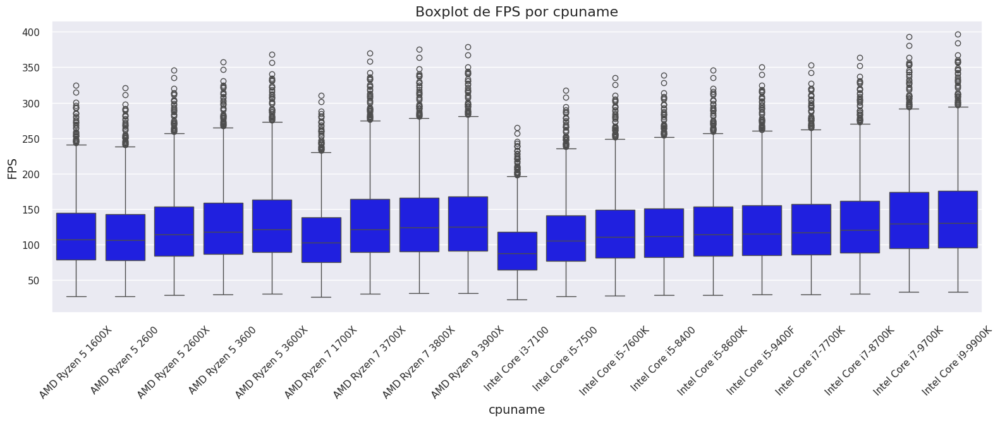

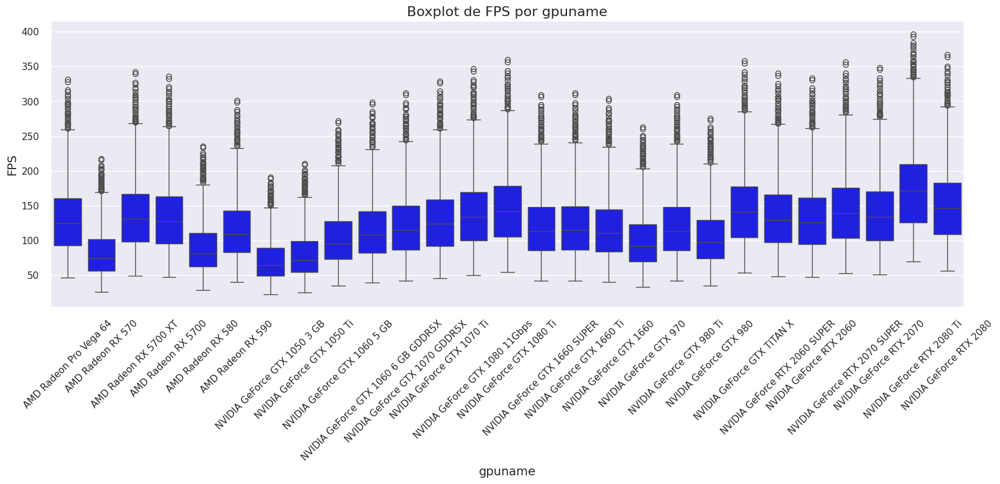

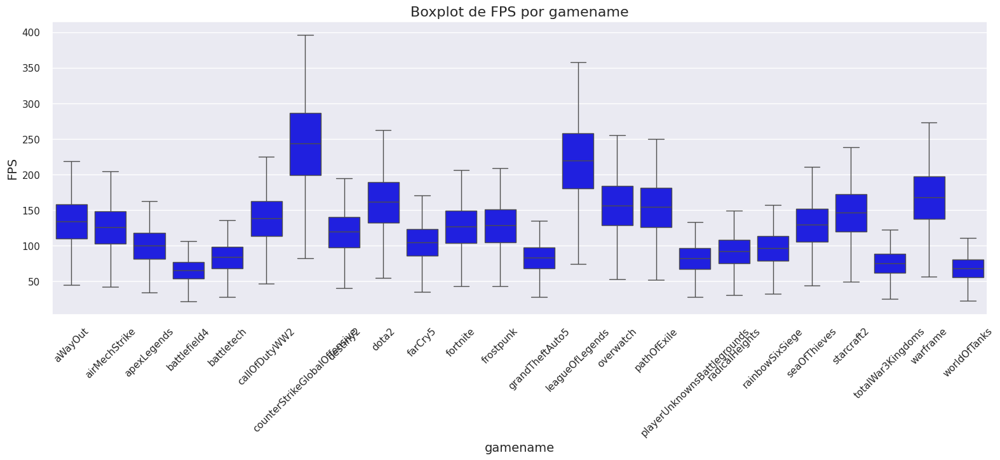

In [ ]:
categorical_columns = ['cpuname', 'gpuname', 'gamename']

for col in categorical_columns:
    plt.figure(figsize=(19, 6))
    sns.boxplot(data=fps_df_no_categ, x=col, y='fps', color='blue')
    plt.title(f'Boxplot de FPS por {col}', fontsize=16)
    plt.xlabel(col, fontsize=14)
    plt.ylabel('FPS', fontsize=14)
    plt.xticks(rotation=45)
    plt.show()

Viendo los boxplots, vemos como estas variables son informativas, ya que en funcion de la categoria que escojamos la distribución es distinta. Barajamos varias opciones en esta codificación, como por ejemplo agrupar las gpu's en NVIDIA y AMD, y las cpu's en Intel y AMD, pero asumir que todas las GPU/CPU de una marca tienen el mismo impacto en los FPS ignora las diferencias de modelos específicos. Por ejemplo, una NVIDIA GTX 1050 podría rendir peor que una AMD Radeon RX 570, pero el modelo no captaria estas diferencias si solo usamos AMD/NVIDIA. También pensamos en usar LabelEncoding, pero no queríamos imponer una relacion de orden artificial.

Después de pensarlo, hemos decidido usar **Target Encoding**, una codificación basada en la media de FPS. Con esta codificación asignamos a cada categoria su promedio de FPS. Esto es eficiente en términos de dimensionalidad y nos permite capturar la relación entre la categoría y la variable objetivo sin imponer ningun orden artificial como en LabelEncoding.

In [ ]:
categorical_columns = ['cpuname', 'gpuname', 'gamename']

# Aplicamos Target Encoding
for col in categorical_columns:
    fps_df_no_categ[f'{col}_encoded'] = fps_df_no_categ.groupby(col)['fps'].transform('mean')

# Eliminamos las columnas categóricas originales
fps_df_no_categ = fps_df_no_categ.drop(columns=categorical_columns)

In [ ]:
fps_df_no_categ.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24624 entries, 0 to 24623
Data columns (total 46 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   cpunumberofcores             24624 non-null  float64
 1   cpunumberofthreads           24624 non-null  float64
 2   cpubaseclock                 24624 non-null  float64
 3   cpucachel1                   24624 non-null  float64
 4   cpucachel2                   24624 non-null  float64
 5   cpucachel3                   24624 non-null  float64
 6   cpufrequency                 24624 non-null  float64
 7   cpumultiplier                24624 non-null  float64
 8   cpumultiplierunlocked        24624 non-null  float64
 9   cpuprocesssize               24624 non-null  float64
 10  cputdp                       24624 non-null  float64
 11  cputurboclock                24624 non-null  float64
 12  gpubandwidth                 24624 non-null  float64
 13  gpubaseclock    

Vemos como después de la codificación de las variables categóricas no ha crecido prácticamente nada el total de atributos, y sin embargo ahora todas las variables son numéricas. Podemos decir que la codificación ha sido exitosa.

### Eliminación de variables irrelevantes

Durante la codificación de variables categóricas vimos una variable con categoria constante, y la eliminamos. Nos falta hacerlo con posibles variables numéricas con un único valor posible.

In [ ]:
constant_columns = [col for col in fps_df_no_categ.columns if fps_df_no_categ[col].nunique() == 1]

# Mostramos las columnas con un único valor constante
constant_columns

['cpubaseclock', 'gameresolution']

Vemos como hay dos columnas numéricas con valor constante! Procedemos a eliminarlas porque son irrelevantes de cara a la toma de decisiones.

In [ ]:
fps_df_no_categ = fps_df_no_categ.drop(columns=['cpubaseclock', 'gameresolution'])

### Tratamiento de outliers y valores incoherentes

Para realizar el tratamiento de los outliers de nuestros datos, haremos una exploracion en los valores de nuestras variables para ver si encontramos valores que deberiamos considerar anomalos, ya sea porque no se encuentran cerca del rango intercuartil esperado o porque son potencialmente erroneos.

Dado que tenemos mayormente datos que hacen referencia a componentes informáticos buscaremos, en nuestras variables que sean candidatas a tener valores enteros incluso pares, a ver si encontramos algun valor decimal o senar cuando no debería y procederíamos a eliminarlo del dataset

In [ ]:
columns_to_check = [
    'cpunumberofcores', 'cpunumberofthreads', 'gpufp32performance', 'gpumemorysize',
    'cpucachel1', 'cpucachel2', 'cpucachel3', 'gpumemorybus', 'cpuprocesssize'
]

for column in columns_to_check:
    print(f"Value counts for {column}:")
    print(fps_df_no_categ[column].value_counts())
    print("\n")

Value counts for cpunumberofcores:
cpunumberofcores
6.0     11664
8.0      6480
4.0      3888
2.0      1296
12.0     1296
Name: count, dtype: int64


Value counts for cpunumberofthreads:
cpunumberofthreads
12.0    7776
16.0    5184
6.0     3888
4.0     3888
8.0     2592
24.0    1296
Name: count, dtype: int64


Value counts for gpufp32performance:
gpufp32performance
5.027e+06    1824
4.375e+06    1824
6.060e+06     912
6.175e+06     912
7.119e+06     912
1.106e+07     912
7.949e+06     912
9.754e+06     912
2.332e+06     912
2.138e+06     912
3.920e+06     912
4.981e+06     912
1.345e+07     912
1.007e+07     912
5.437e+06     912
6.463e+06     912
8.186e+06     912
6.451e+06     912
7.181e+06     912
8.873e+06     912
7.465e+06     912
9.062e+06     912
6.691e+06     912
1.134e+07     912
5.095e+06     912
Name: count, dtype: int64


Value counts for gpumemorysize:
gpumemorysize
8000.0     10032
6000.0      5472
4000.0      3648
11000.0     1824
12000.0      912
5000.0       912
3000.0

Como vemos en las variables candidatas, no observamos ningun valor suceptible a ser considerado anómalo, es por eso que conservaremos todos los datos vistos hasta el momento dado que tenemos datos de ordenadores que estan por encima de la media en algunas prestaciones y no por ello queremos descartarlos.

Procederemos a continuación a mostrar los boxplots para ver si econtramos algun valor que se pueda considerar anónmalo debido a su lejanía del intervalo intercuartil de la variable a la que pertenece.

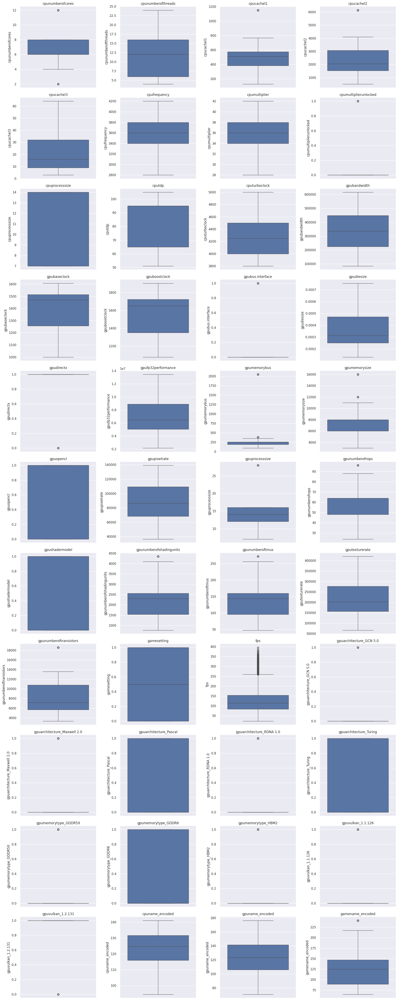

In [ ]:
plt.figure(figsize=(20, 50))

for i, column in enumerate(fps_df_no_categ.columns, 1):
    plt.subplot(11, 4, i)
    sns.boxplot(y=fps_df_no_categ[column])
    plt.title(column)

plt.tight_layout()
plt.show()

Como vemos en los boxplots, los outliers que tenemos no son ningun fallo en la colección de datos, simplemente hay una serie de datos que tienen unos ordenadores con unas capcidades mas grandes que la media, es por eso que los datos que se alejan del rango intercuartil, valores que caen por debajo de Q1−1.5×IQR o por encima de Q3+1.5×IQR, son una representación de la realidad que debemos considerar y no obviar.

Tambien podriamos hacer algun análisis multicolineal de anomalidades pero tambien nos daríamos cuenta que podria por ejemplo tratarse de un caso en el que un ordenador con una GPU muy potente tiene un cuello de botella en la CPU.

#### Transformación de variables

A continuación volveremos a mostrar la distribución que siguen nuestros datos para ver si hay alguna variable que requiera de alguna transformación debido a la necesidad de una corrección de asimetría grave o a la curtosis en los valores
de los datos.

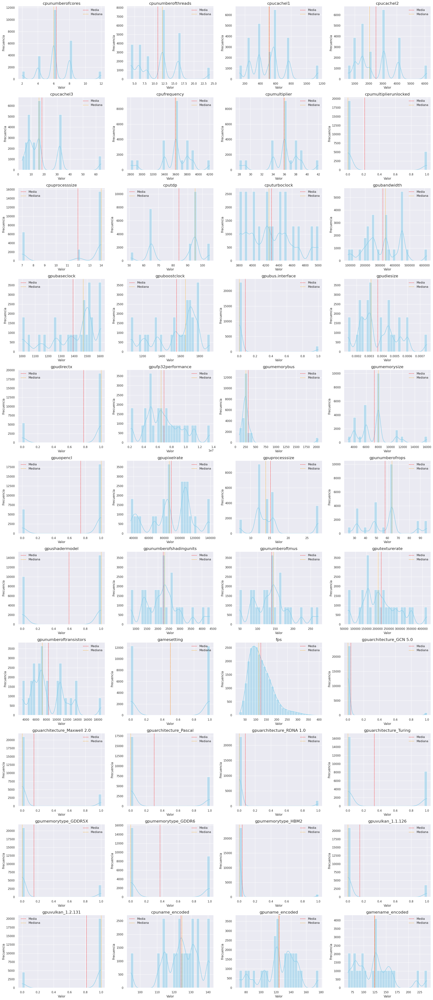

In [ ]:
# Usamos un calculo dinámico de la grid para no hacer nada hard-coded
n_features = len(fps_df_no_categ.columns)
n_cols = 4
n_rows = math.ceil(n_features / n_cols)

# Ajustamos el tamaño del gráfico
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 5))
axes = axes.flatten()

for i, c in enumerate(fps_df_no_categ.columns):
    ax = axes[i]

    if fps_df_no_categ[c].dtype in ['float64']:
        sns.histplot(data=fps_df_no_categ, x=c, ax=ax, bins=30, kde=True, color='skyblue')
        mean = fps_df_no_categ[c].mean()
        median = fps_df_no_categ[c].median()
        ax.axvline(mean, color='red', linestyle='dashed', linewidth=1, label='Media')
        ax.axvline(median, color='orange', linestyle='dashed', linewidth=1, label='Mediana')
        ax.legend()
    elif fps_df_no_categ[c].dtype.name == 'category':
        sns.countplot(data=fps_df_no_categ, x=c, ax=ax, palette='pastel')

    ax.set_title(c, fontsize=16)
    ax.set_xlabel('Valor', fontsize=12)
    ax.set_ylabel('Frecuencia', fontsize=12)

# Ocultamos los subplots vacíos si hay más espacios que columnas
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### Analizando la matriz de correlación

Ahora que todos nuestros datos son numéricos, podemos analizar correctamente la matriz de correlación, para intentar sacar conclusiones y ver si podemos eliminar variables irrelevantes o redundantes (selección de características).

Para ello mostraremos tan solo el tiangulo inferior de la matriz para facilitar el análisis.

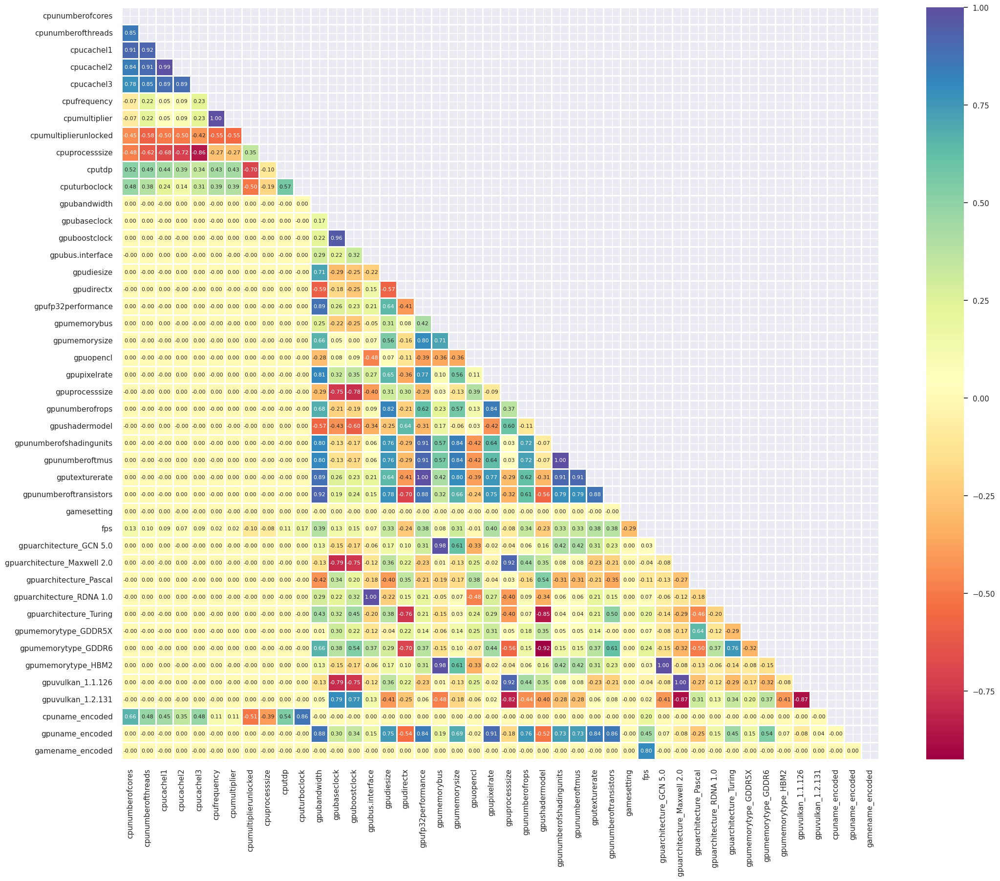

In [ ]:
plt.figure(figsize=(25,20))
corr = fps_df_no_categ.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, cmap='Spectral', linewidths=1, annot=True, fmt=".2f", annot_kws={"size": 8})
plt.show()

Deberiamos comentar varias cosas, dejo un esbozo a continuacion:
- variables de cpu relacionadas entre ellas
- variables de gpu relacionadas entre ellas
- gamesettings y gamename solo se relacionan con los fps
- el gamename es la variable mas correlacionada con los fps

Vemos como por normal general, las variables que hacen referencia a la CPU estan relacionadas entre ellas y lo mismo con las que hacen referencia a la GPU, lo que nos indica que seguramente muchas puedan ser eliminadas o agrupadas.

Observamos tambien como las variables de CPU no tienen ninguna correlación con las variables de GPU.

Podemos ver como las variables gamesettings y gamename solo tienen correlación con la variable objetivo, con un -29% y un 80% respectivamente, lo que parece coherente dado que son dos variables que no tienen ninguna relación directa con ningun componente del hardware.

Si hacemos ya un análisis menos general y más en detalle, podemos ver como hay variables que tienen directamente una correlación del 100%, por lo tanto, haremos una fusión de esas variables y posteriormente procederemos tambien a eliminar las variables que tengan mas de un 90% de relacion entre ellas.

Para finalizar intentaremos buscar correlaciones multilineales que no podemos observar con solamente la matriz de correlación

### Substracción de variables correlacionadas

A continuación haremos un análisis con el objetivo de eliminar las variables que aporten casi la misma varianza al dataset, para eso cojeremos primero las variables que tengan una correlación del 100% y nos quedaremos con una de ellas

#### Correlacion 100%

In [ ]:
# Seleccionamos las variables con una correlación de 1 (100%)
high_correlation_vars = np.where(round(corr, 2) == 1)
high_correlation_pairs = [(corr.index[x], corr.columns[y])
                          for x, y in zip(*high_correlation_vars) if x != y and x < y]

print("Variables con una correlación del 100% entre ellas:")
for pair in high_correlation_pairs:
    print(f"{pair[0]} - {pair[1]}")

Variables con una correlación del 100% entre ellas:
cpufrequency - cpumultiplier
gpubus.interface - gpuarchitecture_RDNA 1.0
gpufp32performance - gputexturerate
gpunumberofshadingunits - gpunumberoftmus
gpuarchitecture_GCN 5.0 - gpumemorytype_HBM2
gpuarchitecture_Maxwell 2.0 - gpuvulkan_1.1.126


Como vemos, tenemos 6 pares de variables que tienen una correlacion del 100%, así que procederemos primero a eliminar una de cada par

In [ ]:
variables_to_drop = ['cpumultiplier', 'gpuarchitecture_RDNA 1.0', 'gpufp32performance', 'gpunumberoftmus', 'gpumemorytype_HBM2', 'gpuarchitecture_Maxwell 2.0']

fps_df_no_100 = fps_df_no_categ.drop(columns=variables_to_drop)

fps_df_no_100.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24624 entries, 0 to 24623
Data columns (total 38 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   cpunumberofcores         24624 non-null  float64
 1   cpunumberofthreads       24624 non-null  float64
 2   cpucachel1               24624 non-null  float64
 3   cpucachel2               24624 non-null  float64
 4   cpucachel3               24624 non-null  float64
 5   cpufrequency             24624 non-null  float64
 6   cpumultiplierunlocked    24624 non-null  float64
 7   cpuprocesssize           24624 non-null  float64
 8   cputdp                   24624 non-null  float64
 9   cputurboclock            24624 non-null  float64
 10  gpubandwidth             24624 non-null  float64
 11  gpubaseclock             24624 non-null  float64
 12  gpuboostclock            24624 non-null  float64
 13  gpubus.interface         24624 non-null  float64
 14  gpudiesize            

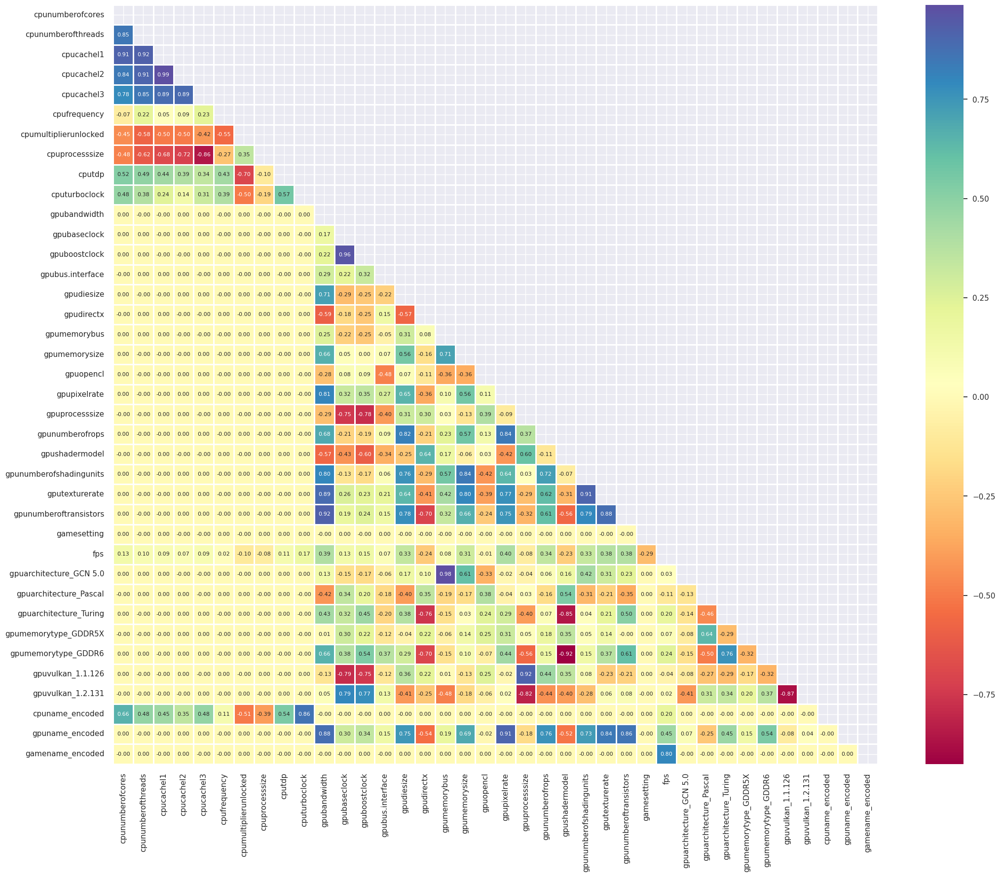

In [ ]:
plt.figure(figsize=(25,20))
corr = fps_df_no_100.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, cmap='Spectral', linewidths=1, annot=True, fmt=".2f", annot_kws={"size": 8})
plt.show()

Vemos como una vez eiminadas las variables con una correlación del 100% tenemos aun bastantes pares de variables con mas de un 80% incluso mas de un 90% de correlación, incluso vemos un gran grupo correlacionado en las caches de la cpu y el numero de cores y threads.

#### Correlación > 0.85, < -0.85
Tras buscar información hemos visto que a partir de un 85% ya se puede considerar que el hecho de tener las dos variables no nos resulta de tan provecho, es por eso que quitaremos aquellas que esten correlacionadas con mas de 0.85 o menos de -0.85.

In [ ]:
# Seleccionamos las variables con una correlación mayor a 0.85 o menor a -0.85
high_correlation_vars = np.where((corr > 0.85) | (corr < -0.85))
high_correlation_pairs = [(corr.index[x], corr.columns[y])
                          for x, y in zip(*high_correlation_vars) if x != y and x < y]

print("Variables con una correlación mayor a 0.85 o menor a -0.85 entre ellas:")
for pair in high_correlation_pairs:
    print(f"{pair[0]} - {pair[1]}")

Variables con una correlación mayor a 0.85 o menor a -0.85 entre ellas:
cpunumberofcores - cpunumberofthreads
cpunumberofcores - cpucachel1
cpunumberofthreads - cpucachel1
cpunumberofthreads - cpucachel2
cpucachel1 - cpucachel2
cpucachel1 - cpucachel3
cpucachel2 - cpucachel3
cpucachel3 - cpuprocesssize
cputurboclock - cpuname_encoded
gpubandwidth - gputexturerate
gpubandwidth - gpunumberoftransistors
gpubandwidth - gpuname_encoded
gpubaseclock - gpuboostclock
gpumemorybus - gpuarchitecture_GCN 5.0
gpupixelrate - gpuname_encoded
gpuprocesssize - gpuvulkan_1.1.126
gpushadermodel - gpuarchitecture_Turing
gpushadermodel - gpumemorytype_GDDR6
gpunumberofshadingunits - gputexturerate
gputexturerate - gpunumberoftransistors
gpunumberoftransistors - gpuname_encoded
gpuvulkan_1.1.126 - gpuvulkan_1.2.131


In [ ]:
variables_to_drop = ['cpunumberofthreads', 'cpucachel1', 'cpucachel3', 'gpuboostclock', 'gpunumberofshadingunits', 'gpuarchitecture_GCN 5.0', 'gpushadermodel', 'gpunumberoftransistors', 'gpuvulkan_1.1.126', 'gputexturerate', 'gpuname_encoded']

fps_df_no_85 = fps_df_no_100.drop(columns=variables_to_drop)

fps_df_no_85.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24624 entries, 0 to 24623
Data columns (total 27 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   cpunumberofcores        24624 non-null  float64
 1   cpucachel2              24624 non-null  float64
 2   cpufrequency            24624 non-null  float64
 3   cpumultiplierunlocked   24624 non-null  float64
 4   cpuprocesssize          24624 non-null  float64
 5   cputdp                  24624 non-null  float64
 6   cputurboclock           24624 non-null  float64
 7   gpubandwidth            24624 non-null  float64
 8   gpubaseclock            24624 non-null  float64
 9   gpubus.interface        24624 non-null  float64
 10  gpudiesize              24624 non-null  float64
 11  gpudirectx              24624 non-null  float64
 12  gpumemorybus            24624 non-null  float64
 13  gpumemorysize           24624 non-null  float64
 14  gpuopencl               24624 non-null

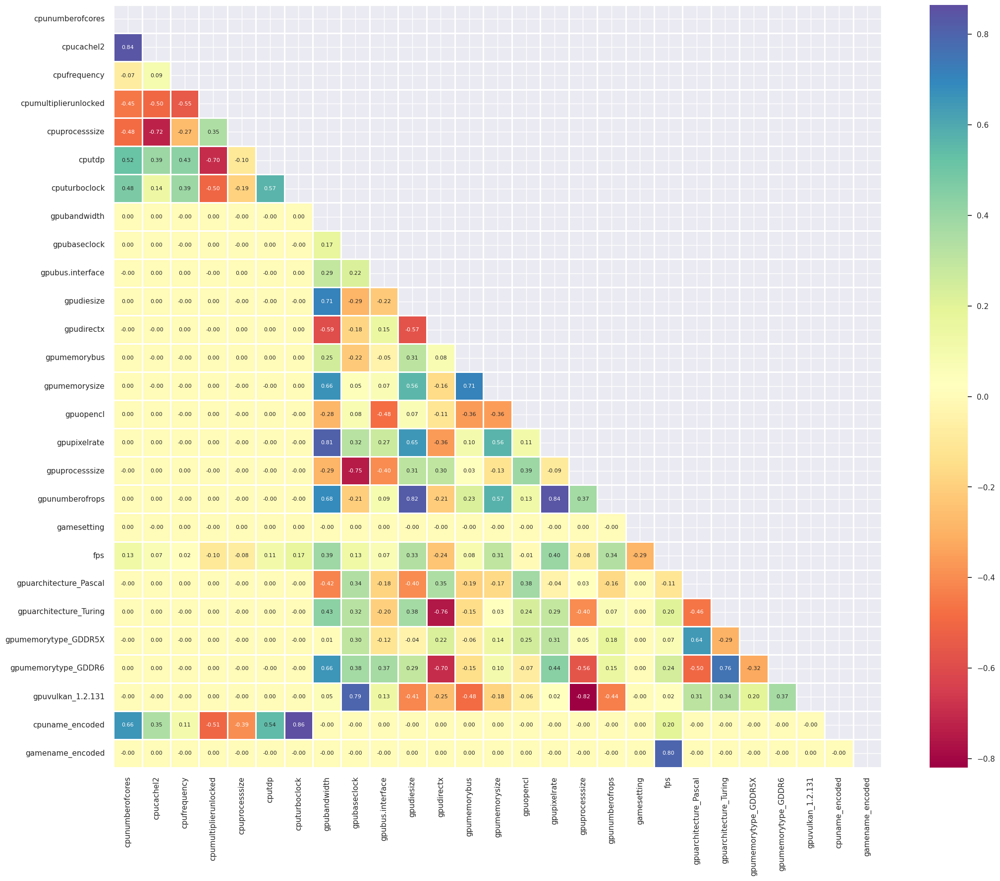

In [ ]:
plt.figure(figsize=(25,20))
corr = fps_df_no_85.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, cmap='Spectral', linewidths=1, annot=True, fmt=".2f", annot_kws={"size": 8})
plt.show()

#### VIF (multicolinealidad)

El **Factor de Inflación de la Varianza (VIF)** es una medida que cuantifica cuánto se inflan las varianzas de los coeficientes estimados en un modelo de regresión debido a la colinealidad entre las variables independientes. En otras palabras, el VIF indica el grado de multicolinealidad presente en un conjunto de variables predictoras.

- **VIF = 1**: No hay correlación entre la variable predictora y las demás variables predictoras.
- **1 < VIF < 5**: Hay una correlación moderada, pero generalmente es aceptable.
- **VIF >= 5**: Alta correlación, lo que indica problemas de multicolinealidad que pueden afectar la estabilidad y la interpretación de los coeficientes del modelo.

El VIF para una variable predictora se calcula de la siguiente manera:
1. Ajustar un modelo de regresión lineal donde la variable predictora en cuestión es la variable dependiente y las demás variables predictoras son las variables independientes.
2. Calcular el coeficiente de determinación \( R^2 \) de este modelo.
3. El VIF se calcula como:
\[ \text{VIF} = \frac{1}{1 - R^2} \]

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(df):
    vif_data = pd.DataFrame()
    vif_data["feature"] = df.columns
    vif_data["VIF"] = [variance_inflation_factor(df.values, i) for i in range(len(df.columns))]
    return vif_data

# Inicialmente calculamos el VIF
vif_data = calculate_vif(fps_df_no_85)
print("Pre-eliminación de features con VIF mayor a 1000:\n", vif_data)

# Iterativamente eliminamos la variable con el VIF más alto hasta que todas estén por debajo de 1000
fps_df_no_VIF = fps_df_no_85.copy()
while vif_data["VIF"].max() > 1000:
    max_vif_feature = vif_data.loc[vif_data["VIF"].idxmax(), "feature"]
    fps_df_no_VIF = fps_df_no_VIF.drop(columns=[max_vif_feature])
    vif_data = calculate_vif(fps_df_no_VIF)

print("Post-eliminación de features con VIF mayor a 1000:\n", vif_data)

Pre-eliminación de features con VIF mayor a 1000:
                    feature       VIF
0         cpunumberofcores   309.013
1               cpucachel2   148.046
2             cpufrequency   869.046
3    cpumultiplierunlocked     4.637
4           cpuprocesssize   137.116
5                   cputdp   104.441
6            cputurboclock  2606.305
7             gpubandwidth   227.917
8             gpubaseclock  1268.603
9         gpubus.interface    27.521
10              gpudiesize   278.076
11              gpudirectx    54.115
12            gpumemorybus    40.543
13           gpumemorysize    68.134
14               gpuopencl    77.103
15            gpupixelrate  1375.536
16          gpuprocesssize   700.561
17         gpunumberofrops  1289.307
18             gamesetting     5.159
19                     fps   115.032
20  gpuarchitecture_Pascal    25.329
21  gpuarchitecture_Turing    74.056
22    gpumemorytype_GDDR5X     5.061
23     gpumemorytype_GDDR6    25.609
24       gpuvulkan_1.2.1

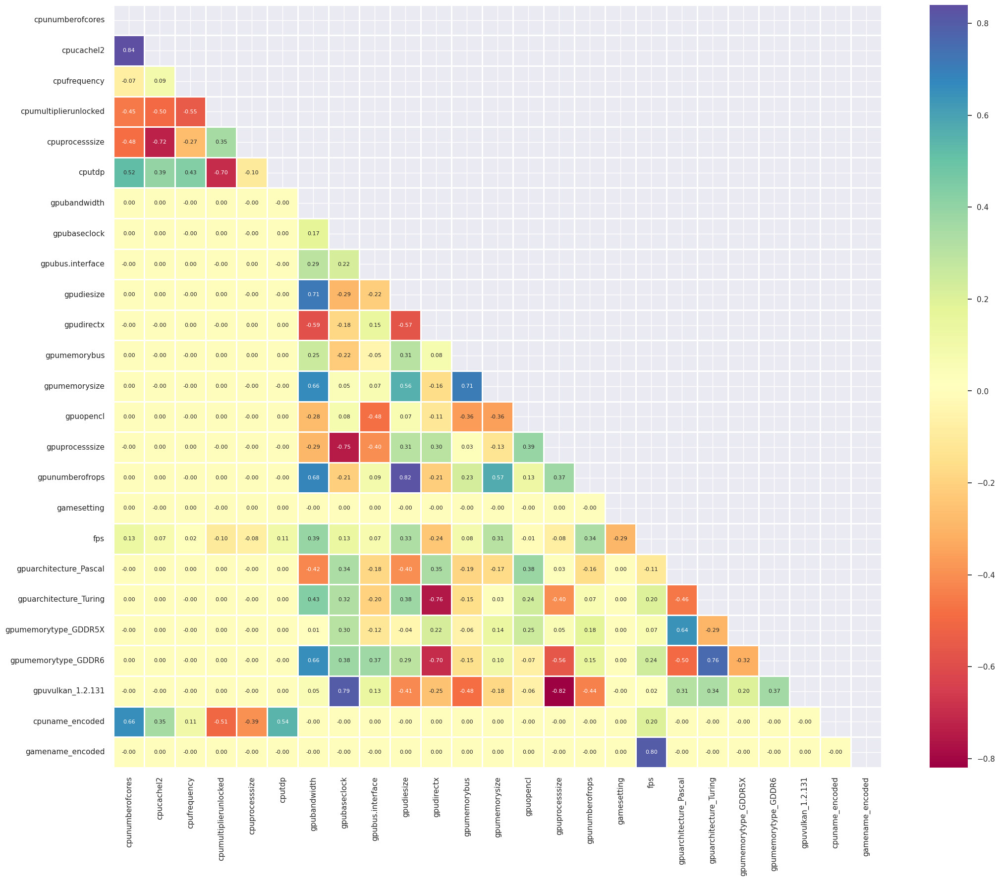

In [ ]:
plt.figure(figsize=(25,20))
corr = fps_df_no_VIF.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, cmap='Spectral', linewidths=1, annot=True, fmt=".2f", annot_kws={"size": 8})
plt.show()

### Generacion de datasets preprocesados
Todos tendran en comun:
- que no tienen missing values
- no tienen columnas con valores constantes
- conservan los outliers
- no tienen variables con una correlación peer to peer de 100%

Datsets:
- full preprocesing
- full preprocesing con 50% instancias
- preprocesing antes de VIF
- preprocesing antes de +-0.85
- one-hot econding para todas las variables categóricas
- one-hot econding para todas las variables categóricas con 50% instancias
- one-hot econding para todas las variables categóricas con 33% instancias

**Probar tambien tanto Standard Scaler como MinMaxScaler en los modelos**

#### Full preprocesing, preprocesing antes de VIF y  preprocesing antes de +-0.85
Empezamos añadiendo el que será nuestro main dataset (dado que creemos que es el mejor), fps_df_no_VIF, el datset sin quitar las variables post VIF y el dataset sin quitar las variables con una correlacion de +-85% (solo quitando las que tengan una correlación de 100%)

In [ ]:
datasets = {'fps_df_no_VIF': fps_df_no_VIF, 'fps_df_no_85': fps_df_no_85, 'fps_df_no_100': fps_df_no_100}

#### Full preprocesing con 50% de instancias
Añadimos el dataset main con un 50% menos de variables (por si vemos que la ejecucion con el numero de instancias inicial es demasiado para algun algoritmo)

In [ ]:
fps_df_no_VIF_50 = fps_df_no_VIF.copy()

fps_df_no_VIF_50 = fps_df_no_VIF_50.sample(frac=0.5, random_state=42)

print(f"El dataset tiene {fps_df_no_VIF_50.shape[0]} filas y {fps_df_no_VIF_50.shape[1]} columnas")
print(f"El dataset original tiene {fps_df_no_VIF.shape[0]} filas y {fps_df_no_VIF.shape[1]} columnas")

datasets['fps_df_no_VIF_50'] = fps_df_no_VIF_50

El dataset tiene 12312 filas y 25 columnas
El dataset original tiene 24624 filas y 25 columnas


#### One-hot econding para todas las variables categóricas
Añadimos ahora un dataset con los datos originales eliminando las 4 variables con missing values y las que tienen valores constantes, y hacemos one hot encoding de todas las categóricas sin importar el número de valores únicos que tengan.

In [ ]:
fps_df_fullOneHot = fps_df_no_missing.copy()
fps_df_fullOneHot = fps_df_fullOneHot.drop(columns=['cpubaseclock', 'gameresolution', 'gpuopengl'])

fps_df_fullOneHot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24624 entries, 0 to 24623
Data columns (total 37 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   cpuname                  24624 non-null  category
 1   cpunumberofcores         24624 non-null  float64 
 2   cpunumberofthreads       24624 non-null  float64 
 3   cpucachel1               24624 non-null  float64 
 4   cpucachel2               24624 non-null  float64 
 5   cpucachel3               24624 non-null  float64 
 6   cpufrequency             24624 non-null  float64 
 7   cpumultiplier            24624 non-null  float64 
 8   cpumultiplierunlocked    24624 non-null  category
 9   cpuprocesssize           24624 non-null  float64 
 10  cputdp                   24624 non-null  float64 
 11  cputurboclock            24624 non-null  float64 
 12  gpuname                  24624 non-null  category
 13  gpuarchitecture          24624 non-null  category
 14  gpuban

In [ ]:
fps_df_fullOneHot_encoded = pd.get_dummies(fps_df_fullOneHot, drop_first=True)

fps_df_fullOneHot_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24624 entries, 0 to 24623
Columns: 108 entries, cpunumberofcores to gamesetting_med
dtypes: bool(83), float64(25)
memory usage: 6.6 MB


In [ ]:
corr_matrix = fps_df_fullOneHot_encoded.corr().abs()

high_correlation_vars = np.where(round(corr_matrix, 2) == 1)
high_correlation_pairs = [(corr_matrix.index[x], corr_matrix.columns[y])
                          for x, y in zip(*high_correlation_vars) if x != y and x < y]

print("Variables con una correlación del 100% entre ellas:")
for pair in high_correlation_pairs:
    print(f"{pair[0]} - {pair[1]}")

Variables con una correlación del 100% entre ellas:
cpufrequency - cpumultiplier
gpufp32performance - gputexturerate
gpunumberofshadingunits - gpunumberoftmus
gpuarchitecture_GCN 5.0 - gpumemorytype_HBM2
gpuarchitecture_Maxwell 2.0 - gpuvulkan_1.1.126
gpuarchitecture_RDNA 1.0 - gpubus.interface_PCIe 4.0 x16


In [ ]:
variables_to_drop = ['cpumultiplier', 'gpubus.interface_PCIe 4.0 x16', 'gpufp32performance', 'gpunumberoftmus', 'gpumemorytype_HBM2', 'gpuarchitecture_Maxwell 2.0']

fps_df_fullOneHot_no_100 = fps_df_fullOneHot_encoded.drop(columns=variables_to_drop)

datasets['fps_df_fullOneHot_no_100'] = fps_df_fullOneHot_no_100

In [ ]:
print(datasets.keys())

dict_keys(['fps_df_no_VIF', 'fps_df_no_85', 'fps_df_no_100', 'fps_df_no_VIF_50', 'fps_df_fullOneHot_no_100'])


#### One-hot econding para todas las variables categóricas 50% y 33%
Añadimos ahora el mismo dataset pero con el 50% de las instancias y con 1/3 de las instancias

In [ ]:
fps_df_fullOneHot_no_100_50 = fps_df_fullOneHot_no_100.copy()
fps_df_fullOneHot_no_100_33 = fps_df_fullOneHot_no_100.copy()

fps_df_fullOneHot_no_100_50 = fps_df_fullOneHot_no_100_50.sample(frac=0.5, random_state=42)
fps_df_fullOneHot_no_100_33 = fps_df_fullOneHot_no_100_33.sample(frac=0.33, random_state=42)

print(f"El dataset tiene {fps_df_fullOneHot_no_100_50.shape[0]} filas y {fps_df_fullOneHot_no_100_50.shape[1]} columnas")
print(f"El dataset original tiene {fps_df_fullOneHot_no_100.shape[0]} filas y {fps_df_fullOneHot_no_100.shape[1]} columnas\n")

print(f"El dataset tiene {fps_df_fullOneHot_no_100_33.shape[0]} filas y {fps_df_fullOneHot_no_100_33.shape[1]} columnas")
print(f"El dataset original tiene {fps_df_fullOneHot_no_100.shape[0]} filas y {fps_df_fullOneHot_no_100.shape[1]} columnas")

datasets['fps_df_fullOneHot_no_100_50'] = fps_df_fullOneHot_no_100_50
datasets['fps_df_fullOneHot_no_100_33'] = fps_df_fullOneHot_no_100_33

El dataset tiene 12312 filas y 102 columnas
El dataset original tiene 24624 filas y 102 columnas

El dataset tiene 8126 filas y 102 columnas
El dataset original tiene 24624 filas y 102 columnas


In [ ]:
print(datasets.keys())

dict_keys(['fps_df_no_VIF', 'fps_df_no_85', 'fps_df_no_100', 'fps_df_no_VIF_50', 'fps_df_fullOneHot_no_100', 'fps_df_fullOneHot_no_100_50', 'fps_df_fullOneHot_no_100_33'])


### Normalización de variables

En este punto tenemos el dataset limpio, nos falta normalizar las variables. Cabe destacar que como mejor dataset escojemos el preprocesado sin usar VIF, mas adelante barajaremos la opcion de usar otro de los que tenemos disponibles de cara a ver si mejora el rendimiento.

In [ ]:
from sklearn.preprocessing import StandardScaler

fps_df_normalized = datasets['fps_df_no_VIF'].copy()

numeric_columns = fps_df_normalized.select_dtypes(include=['float64']).columns.drop('fps')

scaler = StandardScaler()
fps_df_normalized[numeric_columns] = scaler.fit_transform(fps_df_normalized[numeric_columns])

In [ ]:
fps_df_clean = fps_df_normalized.copy()

## Partición de los datos

Como recordatorio:
- **Train**: lo usamos para entrenar el modelo.
- **Validación**: se utiliza para evaluar el rendimiento del modelo durante el entrenamiento y tomar decisiones sobre el modelo (detectar sobreajuste, ajustar hiperparámetros, etc)
- **Test**: se utiliza para evaluar el rendimiento final del modelo después del entrenamiento. Este conjunto debe ser completamente independiente de los conjuntos de entrenamiento y validación. Se usa para obtener una medida imparcial del rendimiento del modelo en datos no vistos, es decir, una evaluación realista de cómo el modelo generaliza a datos nuevos.

Como que siempre usaremos validación cruzada, partiremos nuestra partición de train en folds, de forma que provaremos varios folds como validación. Para la partición, usamos 70% para entrenar y 30% para test.

In [ ]:
from sklearn.model_selection import train_test_split

X = fps_df_clean.loc[:, fps_df_clean.columns != 'fps']
y = fps_df_clean['fps']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

print("Dimensiones del conjunto de entrenamiento y prueba:")
print(f"X_train: {X_train.shape}, X_test: {X_test.shape}")
print(f"y_train: {y_train.shape}, y_test: {y_test.shape}")

Dimensiones del conjunto de entrenamiento y prueba:
X_train: (17236, 24), X_test: (7388, 24)
y_train: (17236,), y_test: (7388,)


## Reducción de dimensionalidad

Vamos a probar con dos métodos de reducción de dimensionalidad, uno lineal y otro no-lineal: PCA y t-SNE, respectivamente. En ambos casos, usamos siempre la particion de train. De aquí en adelante, la partición de test solo se tocará para evaluar modelos.

### PCA

Primero observamos el gráfico de varianzas acumuladas e individuales.

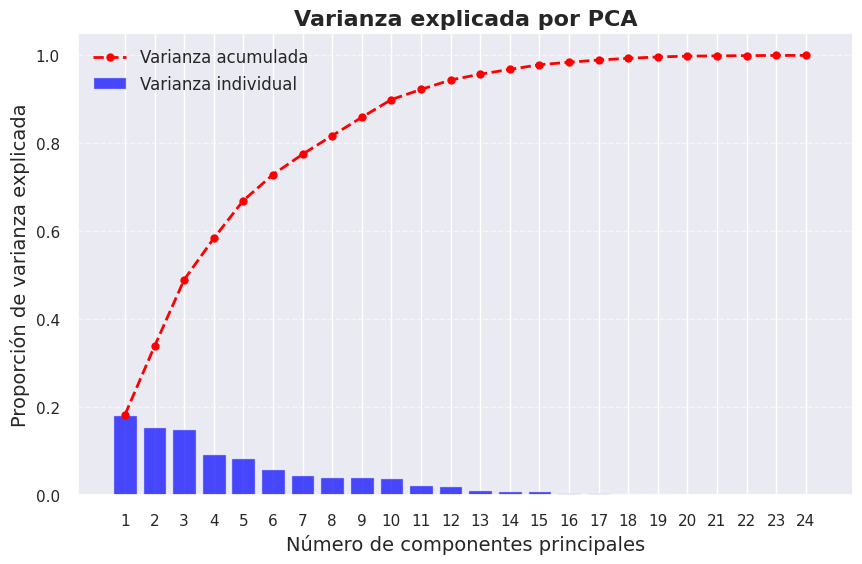

In [ ]:
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(X_train)

# Obtenemos las varianzas explicadas
explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

# gráfico
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, color='blue', alpha=0.7, label='Varianza individual')
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, color='red', marker='o', linestyle='--', linewidth=2, label='Varianza acumulada')

plt.title('Varianza explicada por PCA', fontsize=16, fontweight='bold')
plt.xlabel('Número de componentes principales', fontsize=14)
plt.ylabel('Proporción de varianza explicada', fontsize=14)
plt.xticks(range(1, len(explained_variance) + 1))
plt.legend(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.show();

Vemos como para explicar mas del 80% de nuestra varianza necesitamos por lo menos 8 componentes. Pese a que con 2 componentes explicamos poco mas del 30% de la varianza, podemos intentar proyectar nuestros ejemplos en esas componentes para ver si somos capaces de ver algun detalle interesante.

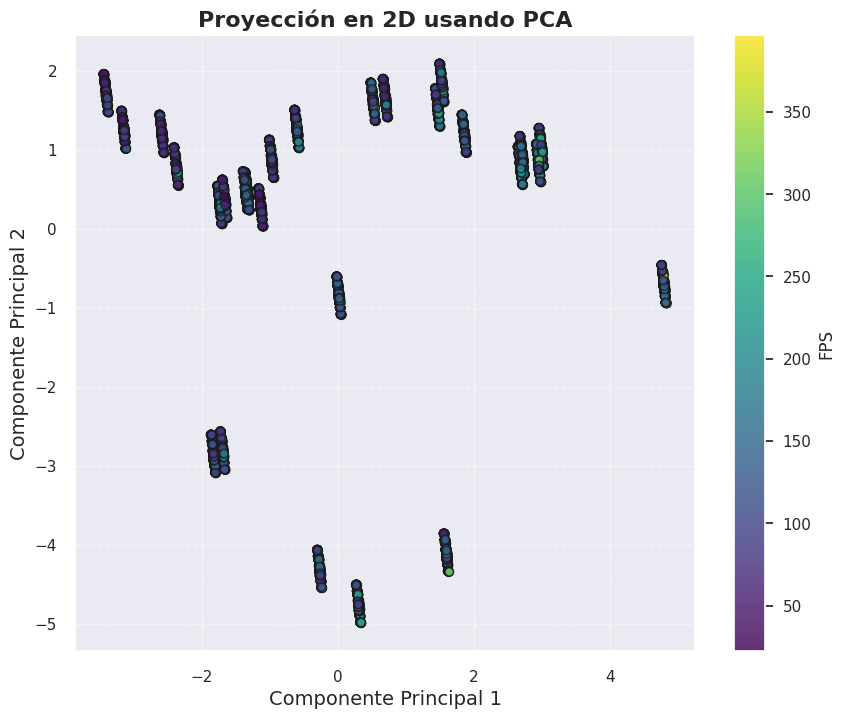

In [ ]:
# Usamos las 2 primeras componentes
pca_2d = PCA(n_components=2)
X_train_pca_2d = pca_2d.fit_transform(X_train)

projection_df = pd.DataFrame(X_train_pca_2d, columns=['PC1', 'PC2'])
projection_df['Target'] = y_train.values

plt.figure(figsize=(10, 8))
scatter = plt.scatter(projection_df['PC1'], projection_df['PC2'],
                       c=projection_df['Target'], cmap='viridis', alpha=0.8, edgecolor='k')

plt.colorbar(scatter, label='FPS')
plt.title('Proyección en 2D usando PCA', fontsize=16, fontweight='bold')
plt.xlabel('Componente Principal 1', fontsize=14)
plt.ylabel('Componente Principal 2', fontsize=14)
plt.grid(alpha=0.6, linestyle='--')

plt.show();


Podemos observar claramente la existencia de grupos. Lo que comparten estos grupos es su proyeccion en la componente principal 1, y lo que varia en cada grupo es su coordenada en el eje que representa la segunda. De todos modos, vemos muchos menos ejemplos que los que sabemos que tenemos, por lo que hay muchos que se proyectan en prácticamente la misma coordenada, es decir, muchos ejemplos tienen la misma proyección en las dos dimensiones que represntan las dos componentes principales. Sabemos que nuestros datos son especificaciones de hardware y configuraciones, por lo que se siguen patrones estructurados y tiene mucho sentido que se agrupen ejemplos en los ejes que mayor varianza explican. Cada grupo comparte alguna característica que los diferencia del resto. Mas adelante observaremos las cargas de cada atributo en las distintas componentes principales, para intentar ver que es lo que diferencia los grupos.

Podemos también intentar realizar la proyeccion sobre las 3 componentes principales (en 3D):

In [ ]:
import plotly.express as px

# Usamos las 3 primeras componentes
pca_3d = PCA(n_components=3)
X_train_pca_3d = pca_3d.fit_transform(X_train)

projection_df = pd.DataFrame(X_train_pca_3d, columns=['PC1', 'PC2', 'PC3'])
projection_df['FPS'] = y_train.values

# Gráfico interactivo con Plotly
fig = px.scatter_3d(
    projection_df,
    x='PC1', y='PC2', z='PC3',
    color='FPS',
    title='Proyección en 3D usando PCA',
    labels={'PC1': 'Componente Principal 1', 'PC2': 'Componente Principal 2', 'PC3': 'Componente Principal 3', 'FPS': 'FPS'},
    color_continuous_scale='Viridis',
    opacity=0.8
)

fig.update_layout(scene=dict(
    xaxis_title='Componente Principal 1',
    yaxis_title='Componente Principal 2',
    zaxis_title='Componente Principal 3'
),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show();



Vemos algo muy similar al apartado anterior.

Finalmente, procedemos a ver la carga de nuestros atributos sobre cada una de las 10 primeras componentes principales. Cabe recordar que con las 10 primeras componentes ya explicamos un 90% de la varianza. Este heatmap nos permitirá sacar conclusiones sobre qué características contribuyen mas en cada componente.

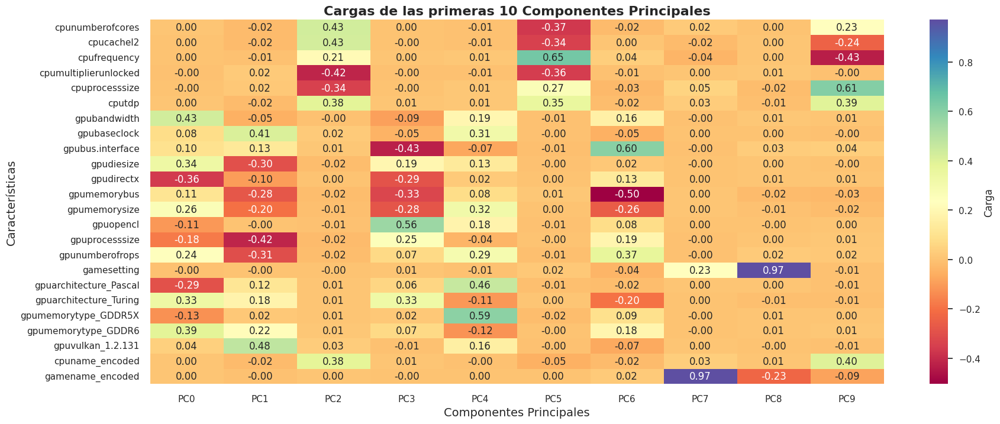

In [ ]:
# Num componentes principales a mostrar
num_components = 10

components = pd.DataFrame(pca.components_[:num_components],
                          columns=X_train.columns,
                          index=[f"PC{i}" for i in range(num_components)])

plt.figure(figsize=(2 * num_components, 8))
sns.heatmap(components.T, cmap='Spectral', annot=True, fmt=".2f", cbar_kws={'label': 'Carga'})
plt.title(f'Cargas de las primeras {num_components} Componentes Principales', fontsize=16, fontweight='bold')
plt.xlabel('Componentes Principales', fontsize=14)
plt.ylabel('Características', fontsize=14)
plt.show()


Este heatmap nos ofrece información muy interesante. Para empezar, vemos como las primeras dos componentes principales son esencialmente determinadas por características relacionadas con la GPU. Así que los grupos que hemos observado en las proyecciones previas se diferencian por el tipo de GPU. Recordemos que no está presente la variable gpuname_encoded ya que ésta estaba altamente correlacionada con ciertas características de la GPU y se eliminó en el preprocesado. Tiene sentido entonces que en esos dos ejes haya grupos mas cercanos y otros mas alejados, todo depende de si sus GPUs tienen características similares o no.

Por otro lado la tercera componente se centra en características de la CPU y por eso en la proyección en 3D vimos que en cada grupo (que ahora sabemos que se relaciona con la GPU) los ejemplos se diferenciaban por su coordenada en la 3a componente, la CPU.

Las demás componentes se definen también por características de la GPU y la CPU, excepto dos que se diferencian del resto:
- **Componente 7**: etá prácticamente dominada por la variable gamename_encoded, que representa el juego probado en el ejemplo.
- **Componente 8**: está prácticamente dominada por la variable gamesetting, que representa la calidad ajustada para el juego (es binaria: media o maxima).

### T-Sne

Vamos a probar ahora con un método no lineal como es t-Sne. Sabemos que este método buscar preservar las relaciones locales (vecinos cercanos) en los datos al reducir las dimensiones. Calcula similitudes entre puntos en alta dimension y trata de replicarlas en baja dimension. Puede que de esta forma veamos algo distinto que con PCA.

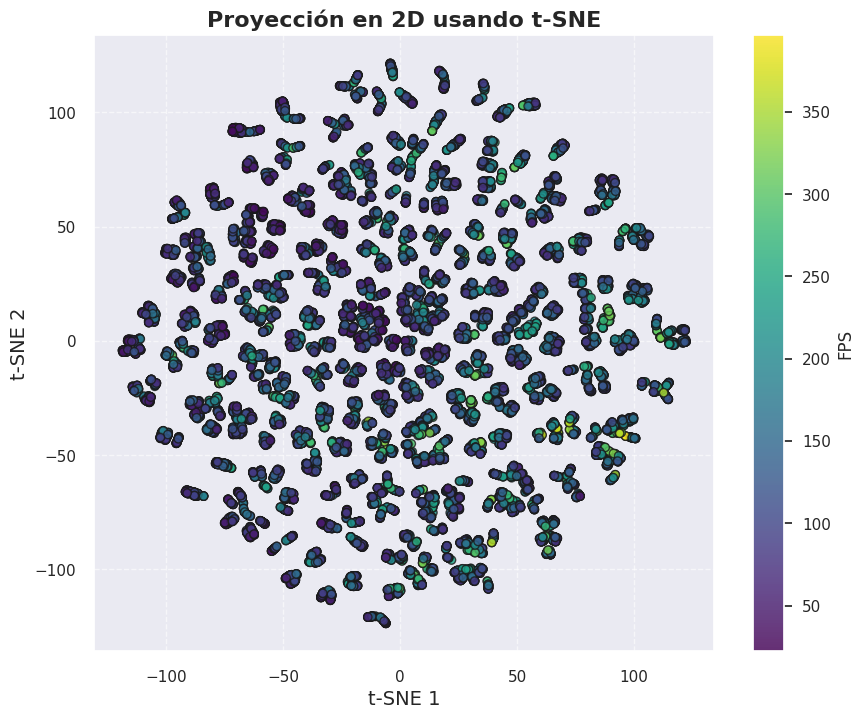

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_train_tsne_2d = tsne.fit_transform(X_train)

tsne_df = pd.DataFrame(X_train_tsne_2d, columns=['TSNE1', 'TSNE2'])
tsne_df['Target'] = y_train.values

plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_df['TSNE1'], tsne_df['TSNE2'],
                       c=tsne_df['Target'], cmap='viridis', alpha=0.8, edgecolor='k')

plt.colorbar(scatter, label='FPS')
plt.title('Proyección en 2D usando t-SNE', fontsize=16, fontweight='bold')
plt.xlabel('t-SNE 1', fontsize=14)
plt.ylabel('t-SNE 2', fontsize=14)
plt.grid(alpha=0.6, linestyle='--')
plt.show();


En este gráfico observamos, de nuevo, la existencia de muchos grupos. Ests grupos deben ser todos los que se crean teniendo en cuenta todas las características.

## Entrenamiento de modelos

En los siguientes dos apartados entrenaremos modelos lineales y no lineales. De cara a mantener los resultados de los mejores modelos definimos una funcion save_results que nos permite guardar en un dataframe los distintos resultados que vamos obteniendo. Además, escojemos el dataset preprocesado que queremos usar de los que tenemos disponibles y realizamos la partición train_test que usaremos en todos los modelos. Para evitar hacer demasiado extenso el notebook, éste solo contiene el entrenamiento con el dataset preprocesado que mejores resultados ha ofrecido. Los autores del notebook ya han probado previamente con los demás para llegar a obtener el mejor.

Cabe destacar también que tenemos dos versiones de la partición de train/test, una con Standard Scaler (estandarización) y otra con Min Max Scaler (normalización a rango [0,1]), ya que en algunos modelos va mejor uno u otro. Por ejemplo, si el modelo se basa en distancias es mejor escalar los atributos a un mismo rango de valores, pero si el modelo asume que las variables son gausianas suele ser mejor estandarizar. Definimos también el número de folds que usaremos en la validación cruzada, de forma que usemos siempre el mismo valor. De igual modo sucede con el número de iteraciones de la búsqueda Bayesiana.

In [ ]:
from time import time
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
def save_results(regressor, X_train, y_train, X_test, y_test, nreg, df):
    df.loc[nreg, 'train R2'] = r2_score(y_train, regressor.predict(X_train))
    df.loc[nreg, 'test R2'] = r2_score(y_test, regressor.predict(X_test))
    df.loc[nreg, 'MSE'] = mean_squared_error(y_test, regressor.predict(X_test))
    df.loc[nreg, 'MAE'] = mean_absolute_error(y_test, regressor.predict(X_test))
    return df

results_df = pd.DataFrame()

## Numero de folds que usaremos en validacion cruzada
num_folds = 5

## Numero de iteraciones para la búsqueda Bayesiana
n_iter = 30

In [ ]:
from sklearn.model_selection import train_test_split

full_df = datasets['fps_df_no_VIF'].copy()

X = full_df.drop(columns=['fps'])
y = full_df['fps']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

min_max = MinMaxScaler()
X_train_scaled_MM = min_max.fit_transform(X_train)
X_test_scaled_MM = min_max.transform(X_test)

standard = StandardScaler()
X_train_scaled_STD = standard.fit_transform(X_train)
X_test_scaled_STD = standard.transform(X_test)

print("Dimensiones del conjunto de entrenamiento y prueba después del escalado:")
print(f"X_train_scaled: {X_train_scaled_MM.shape}, X_test_scaled: {X_test_scaled_MM.shape}")
print(f"y_train: {y_train.shape}, y_test: {y_test.shape}")

Dimensiones del conjunto de entrenamiento y prueba después del escalado:
X_train_scaled: (17236, 24), X_test_scaled: (7388, 24)
y_train: (17236,), y_test: (7388,)


## Entrenamiento de modelos lineales

En este apartado entrenamos distintos modelos lineales. Si existen hiperparámetros que ajustar realizamos una exploración adecuada. Dado que tenemos un problema de regresión hemos decidido explorar todos los modelos propuestos para tener un análisis más amplio.

Entrenaremos los siguientes 6 modelos lineales/cuadráticos:
- **Linear regresion**
- **Ridge regression**
- **LASSO**
- **KNN**
- **SVM lineal**
- **SVM cuadrático**

### Linear Regression

Sabemos que para la regresión lineal suele ser mejor estandarizar, así que usaremos la versión estandarizada de la partición train/test.

In [ ]:
X_train_scaled = X_train_scaled_STD
X_test_scaled = X_test_scaled_STD

In [ ]:
from sklearn.linear_model import LinearRegression

# Entrenamos el modelo
lr = LinearRegression().fit(X_train_scaled, y_train)

results_df = save_results(lr, X_train_scaled, y_train, X_test_scaled, y_test, 'Linear Regression', results_df)

Después de entrenar el modelo, vamos a observar el gráfico de los residuos para ver si hay cosas extrañas en nuestra distribución.

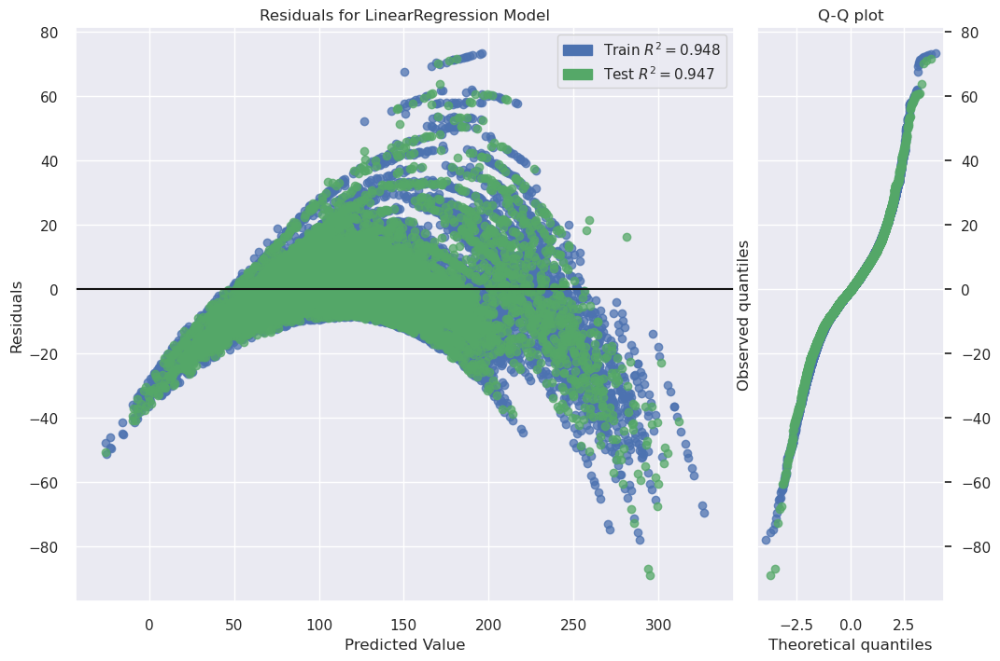

In [ ]:
from yellowbrick.regressor import residuals_plot

# Visualizamos los residuos
plt.figure(figsize=(12, 8))
viz = residuals_plot(
    lr,
    X_train_scaled,
    y_train,
    X_test_scaled,
    y_test,
    is_fitted=True,
    qqplot=True,
    hist=False
)
plt.show()

No vemos en absoluto la nube gaussiana que esperariamos, si no que observamos una especie de parábola. De todos modos, vamos a ver las predicciones respecto a los valores reales y cuanto se desvían de la predicción ideal.

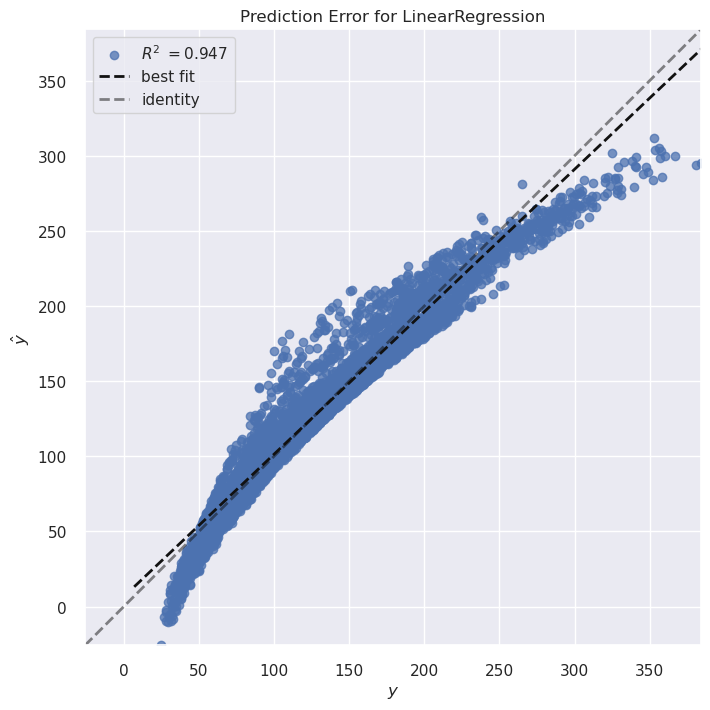

In [ ]:
from yellowbrick.regressor import prediction_error
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
visualizer = prediction_error(lr, X_test_scaled, y_test, is_fitted=True)
plt.show()

El eje y representa las predicciones de nuestro modelo, mientras que el eje x representa los valores reales de la variable objetivo. Es evidente entonces que en un modelo perfecto uno esperaria que todos los puntos se ajusten con la diagonal identidad. En este gráfico observamos que el R^2 (qué tan bien el modelo captura la relación entre las variables dependientes e independientes) es alto, sin embargo hay bastante error en ejemplos con muy pocos FPS o muchos FPS, incluso bastante error con FPS medios. Esto es debido a que esos ejemplos son minoritarios, y el hecho de acertar mucho en lo mas habitual ya hace crecer mucho el coeficiente de determinación. Esperamos mejorar la precisión en esos ejemplos en modelos posteriores.

#### Interpretabilidad

La ventaja de los modelos lineales es que son directamente interpretables a partir de sus pesos. El modelo que hemos obtenido es decente, y seria buena idea intentar ver que pesos asigna el modelo a cada uno de los atributos, para tratar de deducir qué tiene mas importancia.

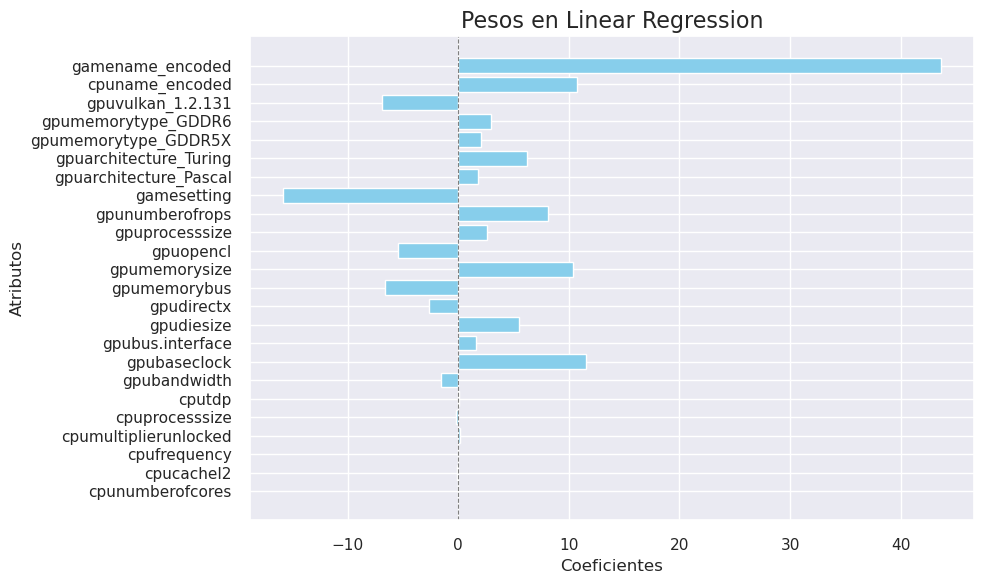

In [ ]:
coefficients = lr.coef_
feature_names = X_train.columns

plt.figure(figsize=(10, 6))
plt.barh(feature_names, coefficients, color="skyblue")
plt.axvline(0, color='gray', linewidth=0.8, linestyle='--')
plt.title("Pesos en Linear Regression", fontsize=16)
plt.xlabel("Coeficientes", fontsize=12)
plt.ylabel("Atributos", fontsize=12)
plt.tight_layout()

plt.show()

Vemos algo muy interesante, la variable con mas peso asignado es con diferencia el nombre del juego probado (codificado previamente con target encoding). Por otro lado la que tiene el peso negativo mayor es gamesettings, que tiene sentido ya que se trata de una variable binaria donde si tenemos un 1 estamos en configuración de calidad máxima, por lo que es normal que haga disminuir los FPS. Las variables relacionadas con la GPU tienen bastante impacto en la decisión del modelo, y respecto la CPU lo único con peso considerable es el nombre codificado.

In [ ]:
show_html(results_df.sort_values(by='test R2', ascending=False).to_html())

,train R2,test R2,MSE,MAE
Linear Regression,0.948,0.947,151.605,8.535


### Ridge Regreesion

Vamos a probar ahora con una regresión Ridge, escogiendo el valor de lambda con validación cruzada. Cabe recordar que lambda es el parámetro de regularización que controla cuánto penalizamos la magnitud de los coeficientes del modelo. En este caso, usar los datos estandarizados sigue siendo la mejor opción.

In [ ]:
X_train_scaled = X_train_scaled_STD
X_test_scaled = X_test_scaled_STD

In [ ]:
lambdas = [1e-4,1e-3,1e-2,0.1, 0.5,1,5,10,50,100, 200, 500, 1000, 2000]
ridge_cv = RidgeCV(alphas=lambdas,cv=num_folds).fit(X_train_scaled, y_train)

print(f'Best lambda: {ridge_cv.alpha_} R2 score: {ridge_cv.best_score_:3.3f}')

results_df = save_results(ridge_cv, X_train_scaled, y_train, X_test_scaled, y_test, 'Ridge', results_df)

Best lambda: 5.0 R2 score: 0.948


Obtenemos que el mejor valor de lambda es de 5. Vamos a observar un gráfico para ver como evoluciona el rendimiento en función del valor de lambda:

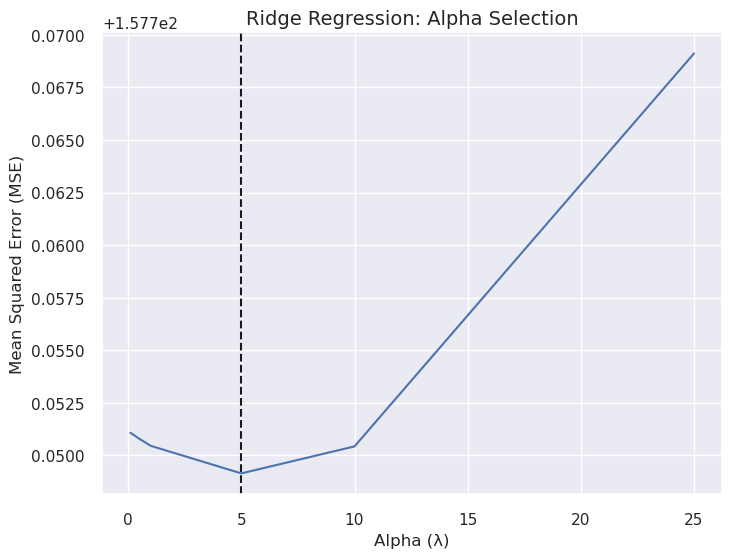

In [ ]:
lambdas_to_show = [0.1, 0.5, 1, 5, 10, 25]

plt.figure(figsize=(8, 6))
vis = AlphaSelection(RidgeCV(alphas=lambdas_to_show))
vis.fit(X_train_scaled, y_train)

plt.xlabel('Alpha (λ)', fontsize=12)
plt.ylabel('Mean Squared Error (MSE)', fontsize=12)
plt.title('Ridge Regression: Alpha Selection', fontsize=14)
plt.show();

Vemos para valores superiores a 5 el modelo solo empeora. De nuevo, podemos observar los residuos:

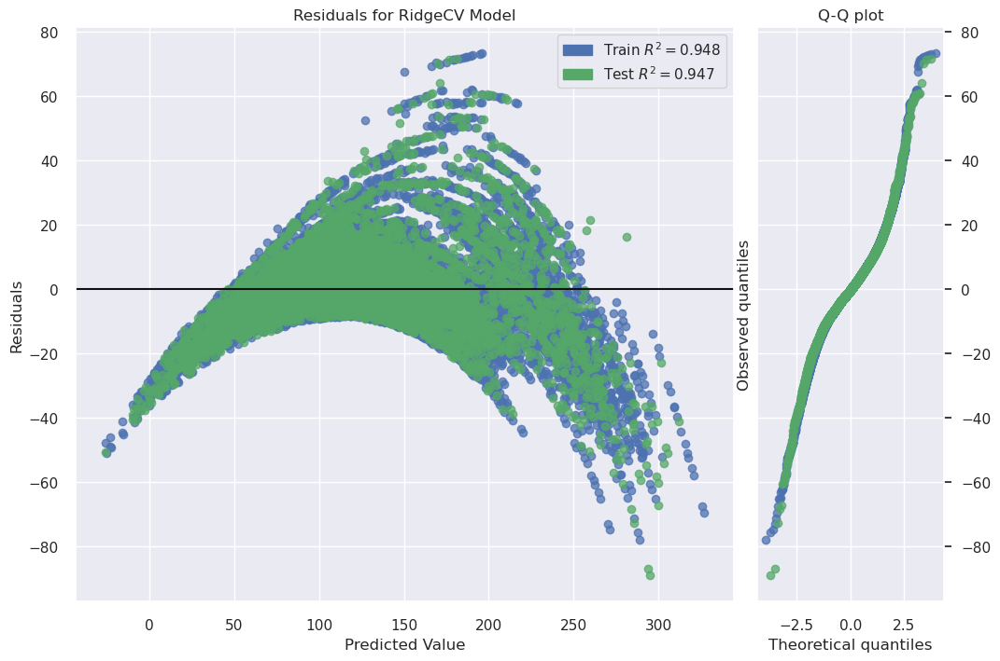

In [ ]:
plt.figure(figsize=(12,8));
viz = residuals_plot(ridge_cv, X_train_scaled, y_train, X_test_scaled, y_test, is_fitted=True, qqplot=True, hist=False);

Vemos algo muy similar a la regresión lineal sin regularización. De hecho el R^2 en test es exactamente el mismo. Vamos a ver las predicciones respecto los valores reales. De nuevo, observamos algo prácticamente idéntico que con la regresión lineal simple.

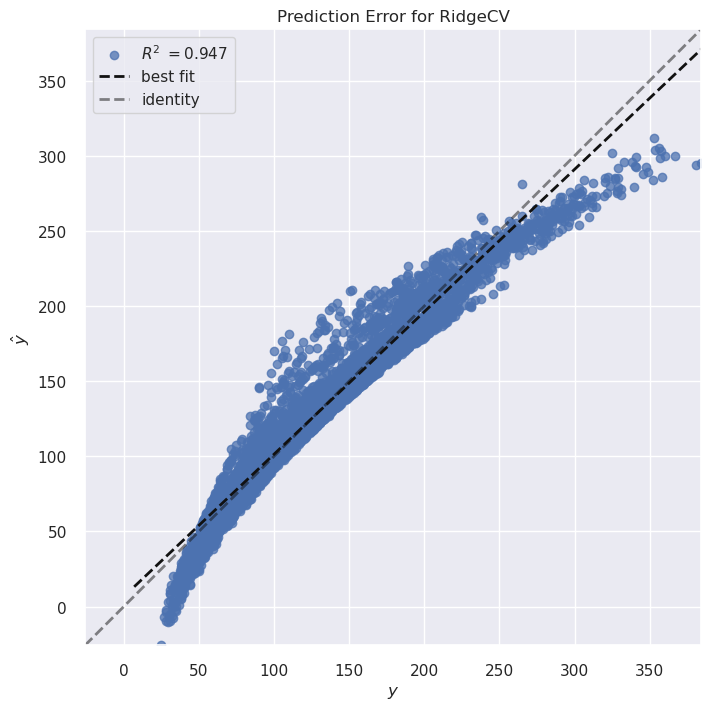

In [ ]:
plt.figure(figsize=(8, 8))
visualizer = prediction_error(ridge_cv, X_test_scaled, y_test, is_fitted=True)

#### Interpretabilidad

Vemos lo mismo que con la regresión lineal simple.

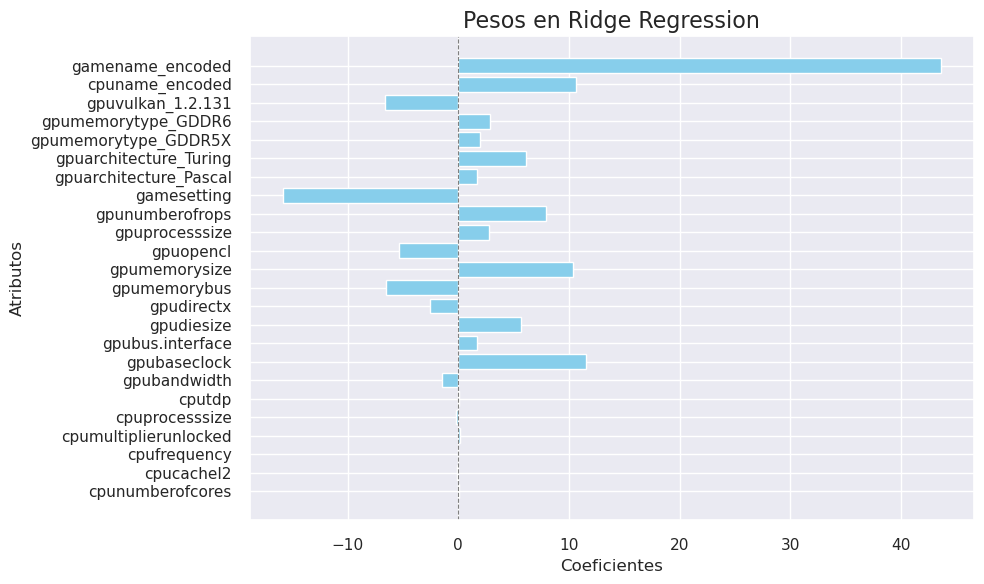

In [ ]:
coefficients = ridge_cv.coef_
feature_names = X_train.columns

plt.figure(figsize=(10, 6))
plt.barh(feature_names, coefficients, color="skyblue")
plt.axvline(0, color='gray', linewidth=0.8, linestyle='--')
plt.title("Pesos en Ridge Regression", fontsize=16)
plt.xlabel("Coeficientes", fontsize=12)
plt.ylabel("Atributos", fontsize=12)
plt.tight_layout()

plt.show()

In [ ]:
show_html(results_df.sort_values(by='test R2', ascending=False).to_html())

,train R2,test R2,MSE,MAE
Ridge,0.948,0.947,151.584,8.534
Linear Regression,0.948,0.947,151.605,8.535


### LASSO

Ahora nos toca probar con la regresión LASSO, de nuevo escogiendo el valor de lambda con validación cruzada. Sabiendo que Ridge nos ha ofrecido un modelo prácticamente idéntico que la regresión lineal simple, no esperamos mucha mejora.

In [ ]:
X_train_scaled = X_train_scaled_STD
X_test_scaled = X_test_scaled_STD

In [ ]:
lasso_cv = LassoCV(alphas=lambdas,cv=5).fit(X_train_scaled,y_train)
print('Best lambda:', lasso_cv.alpha_)

results_df = save_results(lasso_cv, X_train_scaled, y_train, X_test_scaled, y_test, 'LASSO', results_df)

Best lambda: 0.001


Aquí el mejor valor de lambda es bastante distinto, en Ridge era de 5, sin embargo en LASSO es mucho mas pequeño. De todos modos, si miramos los residuos y las predicciones contra los valores reales observamos de nuevo un modelo muy parecido:

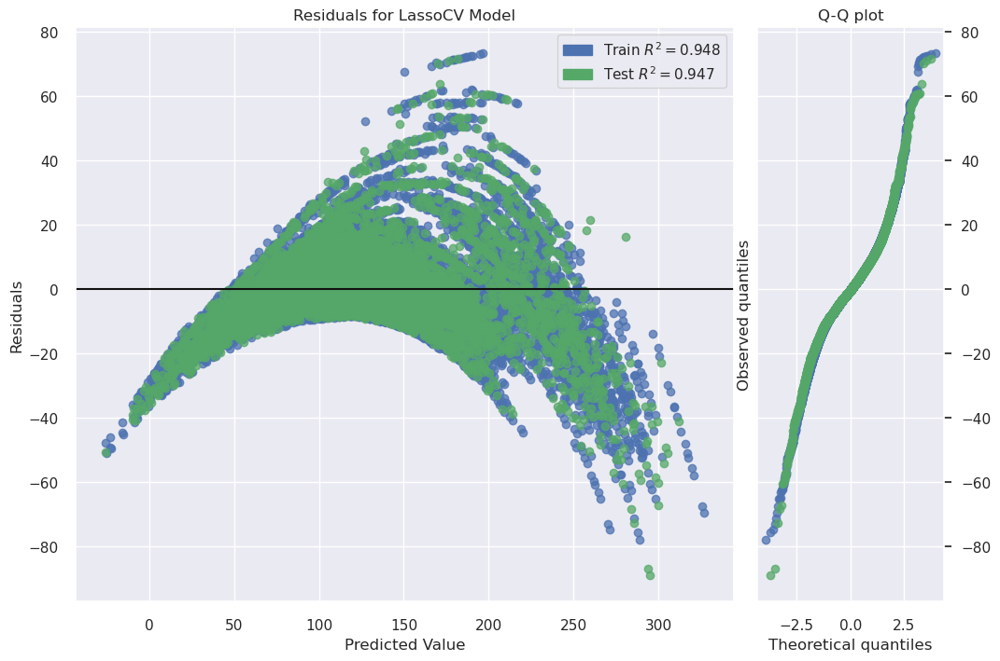

In [ ]:
plt.figure(figsize=(12,8));
viz = residuals_plot(lasso_cv, X_train_scaled, y_train, X_test_scaled, y_test, is_fitted=True, qqplot=True, hist=False);

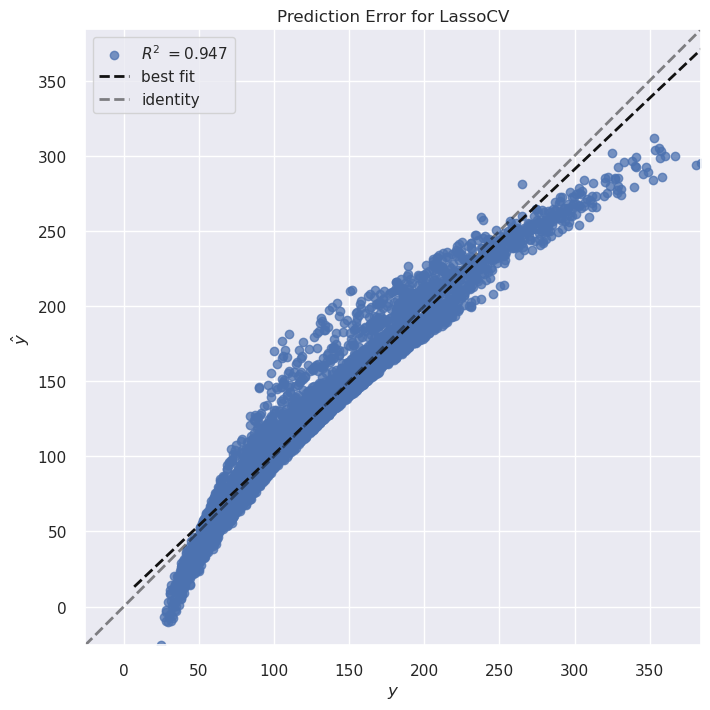

In [ ]:
plt.figure(figsize=(8, 8))
visualizer = prediction_error(lasso_cv, X_test_scaled, y_test, is_fitted=True)

No incluimos apartado de interpretabilidad, porque de nuevo vuelve a ser lo mismo.

In [ ]:
show_html(results_df.sort_values(by='test R2', ascending=False).to_html())

,train R2,test R2,MSE,MAE
Ridge,0.948,0.947,151.584,8.534
LASSO,0.948,0.947,151.584,8.534
Linear Regression,0.948,0.947,151.605,8.535


### KNN

Para aplicar knn a nuestros datos, hemos realizado una exploracion de hiperparámetros previa.

En este caso, como que el modelo KNN se basa en distancias, sabemos que suele ser mejor normalizar a un mismo rango de valores. Es por este motivo que hemos decidido usar la versión de la partición train/test con los datos normalizados con Min Max Scaler.

In [ ]:
X_train_scaled = X_train_scaled_MM
X_test_scaled = X_test_scaled_MM

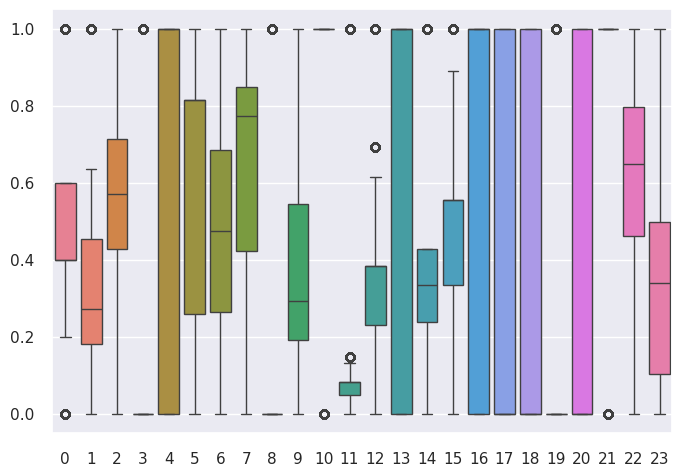

In [ ]:
sns.boxplot(data=X_train_scaled)
plt.show()

In [ ]:
knn = KNeighborsRegressor()

# param_grid = {
#     'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19, 21],
#     'weights': ['uniform', 'distance'],
#     'metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski']
# }

param_grid = {
    'n_neighbors': [3],
    'weights': ['distance'],
    'metric': ['chebyshev']
}

grid_search = GridSearchCV(estimator=knn, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

grid_search.fit(X_train_scaled, y_train)

print("Mejores hiperparámetros encontrados:")
print(grid_search.best_params_)

best_knn = grid_search.best_estimator_
y_pred = best_knn.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mejores hiperparámetros encontrados:
{'metric': 'chebyshev', 'n_neighbors': 3, 'weights': 'distance'}
Mean Squared Error: 55.1861997113569
R^2 Score: 0.980880976388513


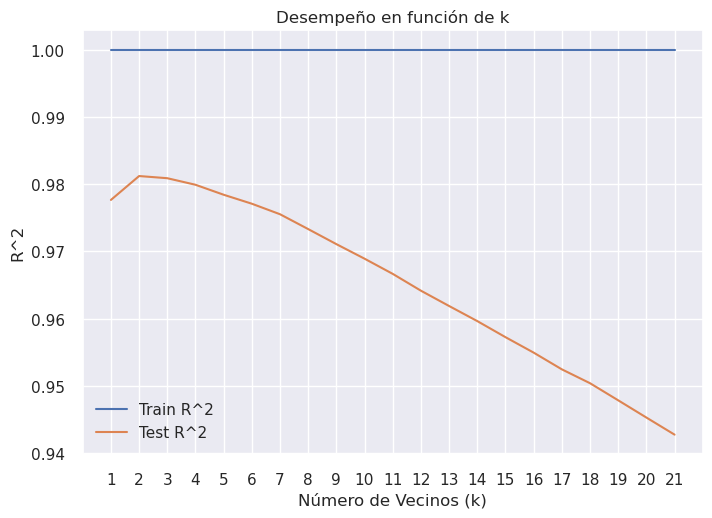

In [ ]:
import numpy as np

k_values = range(1, 22)
train_scores = []
test_scores = []

best_metric = best_knn.get_params()['metric']
best_weights = best_knn.get_params()['weights']


for k in k_values:
    knn = KNeighborsRegressor(n_neighbors=k, weights=best_weights, metric=best_metric)
    knn.fit(X_train_scaled, y_train)
    train_scores.append(r2_score(y_train, knn.predict(X_train_scaled)))
    test_scores.append(r2_score(y_test, knn.predict(X_test_scaled)))

plt.plot(k_values, train_scores, label='Train R^2')
plt.plot(k_values, test_scores, label='Test R^2')
plt.xlabel('Número de Vecinos (k)')
plt.ylabel('R^2')
plt.legend()
plt.title('Desempeño en función de k')
plt.xticks(ticks=range(min(k_values), max(k_values) + 1))
plt.show()


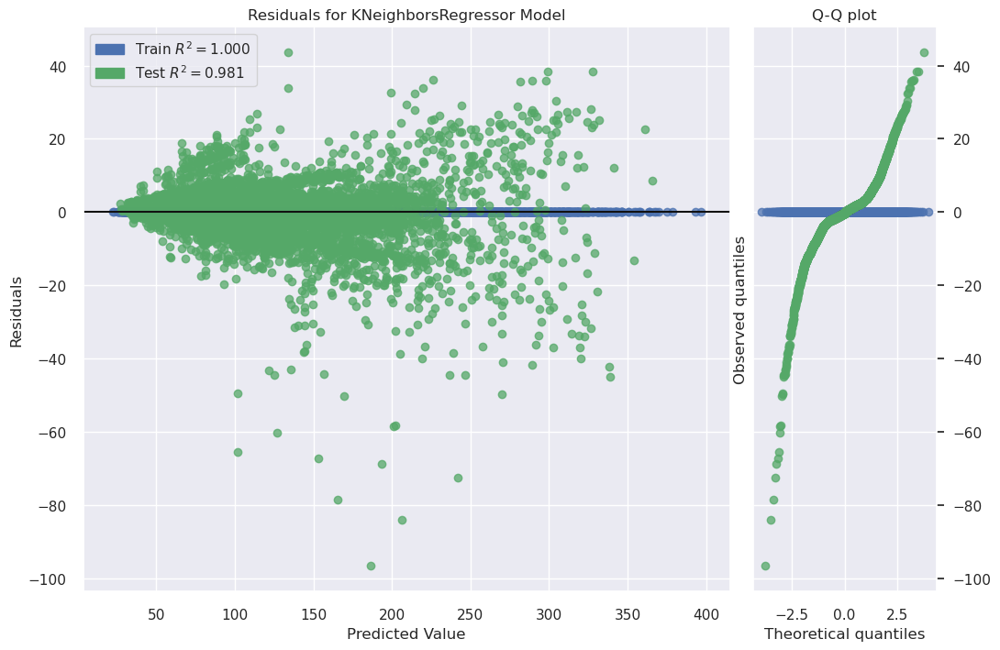

In [ ]:
from yellowbrick.regressor import residuals_plot

plt.figure(figsize=(12, 8))
viz = residuals_plot(best_knn, X_train_scaled, y_train, X_test_scaled, y_test, is_fitted=True, qqplot=True, hist=False)

Como vemos, tanto el la evolucion de la métrica R2 como en el grafo residual como en el qqplot, el modelo sobreajusta al 100% y memoriza los datos de entrenamiento.

Así que tras probar, hemos visto que el culpable de la memorización era el hecho de usar como parámetro de pesos distancia, que básicamente usa el inverso de su distancia como peso. En este caso, los vecinos más cercanos a un punto de consulta tendrán una mayor influencia que los vecinos que están más lejos.

Por eso, hemos decidido hacer posteriormente un análisis solo con la métrica uniforme la cual asigna el mismo peso indistintamente de lo lejos que se encuentre.

In [ ]:
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19, 21],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski']
}

grid_search_knn = GridSearchCV(estimator=knn, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

grid_search_knn.fit(X_train_scaled, y_train)

print("Mejores hiperparámetros encontrados:")
print(grid_search_knn.best_params_)

best_knn = grid_search_knn.best_estimator_
y_pred = best_knn.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

Mejores hiperparámetros encontrados:
{'metric': 'chebyshev', 'n_neighbors': 3, 'weights': 'uniform'}
Mean Squared Error: 73.56304186969862
R^2 Score: 0.9745143977698081


Dado que KNN funciona mejor suele funcionar mejor con los datos escalados con un escalado MinMax, ya no mostraremos los resultados con datos escaldos con StandardScaler (lo hemos hecho de forma auxiliar y efectivamente así era, pero no lo incluimos)

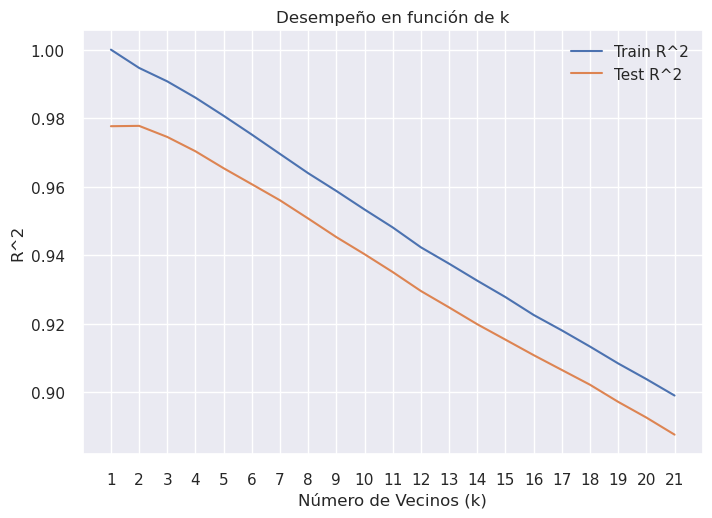

In [ ]:
k_values = range(1, 22)
train_scores = []
test_scores = []

best_metric = best_knn.get_params()['metric']
best_weights = best_knn.get_params()['weights']


for k in k_values:
    knn = KNeighborsRegressor(n_neighbors=k, weights=best_weights, metric=best_metric)
    knn.fit(X_train_scaled, y_train)
    train_scores.append(r2_score(y_train, knn.predict(X_train_scaled)))
    test_scores.append(r2_score(y_test, knn.predict(X_test_scaled)))

plt.plot(k_values, train_scores, label='Train R^2')
plt.plot(k_values, test_scores, label='Test R^2')
plt.xlabel('Número de Vecinos (k)')
plt.ylabel('R^2')
plt.legend()
plt.title('Desempeño en función de k')
plt.xticks(ticks=range(min(k_values), max(k_values) + 1))
plt.show()


Como vemos en el gráfico de la evolución del número de vecinos, cuantos mas vecinos, peor se comporta el modelo, observamos como si usasemos 1 solo vecino, tendríamos un 100% de overfitting en nuestros datos de entrenaminento y un ~98% en los de prueba, sin embargo, si usamos 3 vecinos vemos como el modelo ya no tiene un sobreajuste del 100% y no perdemos tanto en el conjunto de prueba.

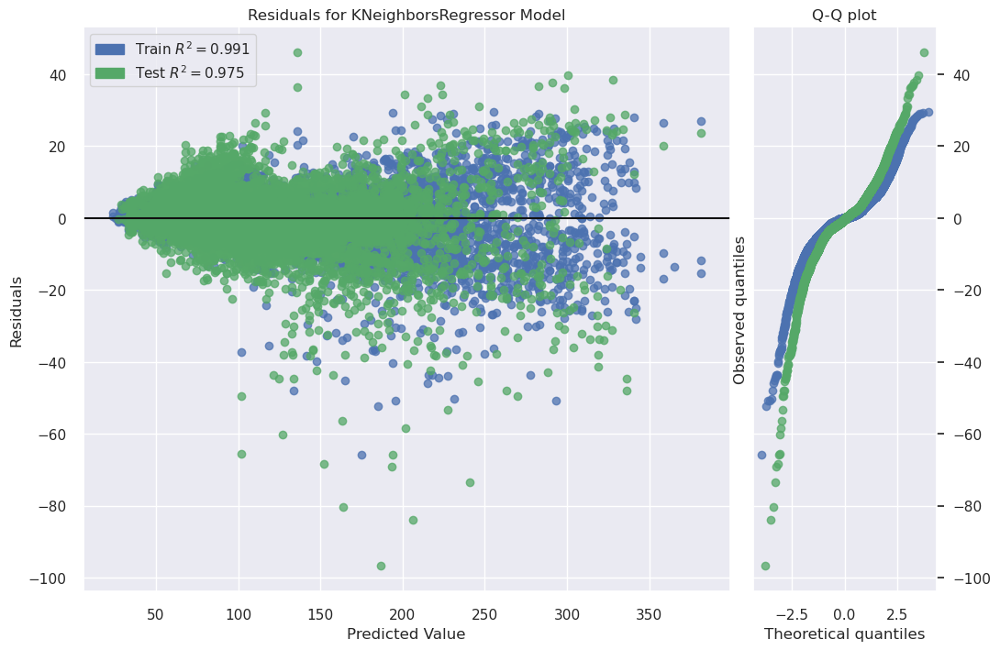

In [ ]:
plt.figure(figsize=(12, 8))
viz = residuals_plot(best_knn, X_train_scaled, y_train, X_test_scaled, y_test, is_fitted=True, qqplot=True, hist=False)

Observamos ahora como el modelo no memoriza completamente los valores de entrenamiento, podemos ver en el grafo residual que hay errores (los datos no estan sobre la recta y = 0).

Por otra parte, vemos como ya esperamos en nuestro análisis exploratorio de las variables, que nuestros datos no siguen una distribución muy gaussiana, vemos como no se ajustan demasiado a una recta x = y y vemos que en las colas de las distribuciones del conjunto de test y train hay un desfase un poco notorio.

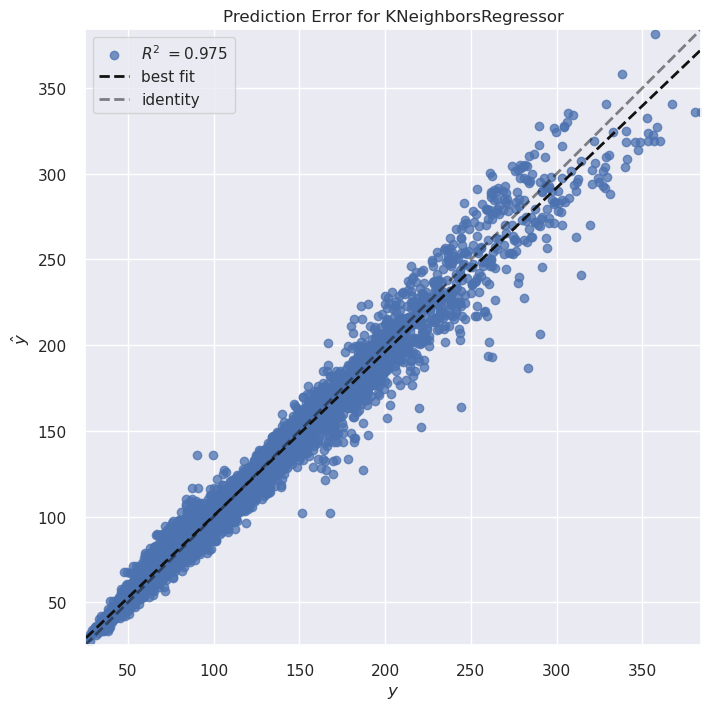

In [ ]:
from yellowbrick.regressor import prediction_error

plt.figure(figsize=(8, 8))
visualizer = prediction_error(best_knn, X_test_scaled, y_test, is_fitted=True)
visualizer.show();

Observamos por otra parte un ligero sobreajuste en los datos comparando la métrica R² del conjunto de entrenamiento y del conjunto de prueba.

In [ ]:
print("R² Score en el conjunto de entrenamiento:", best_knn.score(X_train_scaled, y_train))
print("R² Score en el conjunto de prueba:", best_knn.score(X_test_scaled, y_test))

R² Score en el conjunto de entrenamiento: 0.9907363490071411
R² Score en el conjunto de prueba: 0.9745143977698081


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


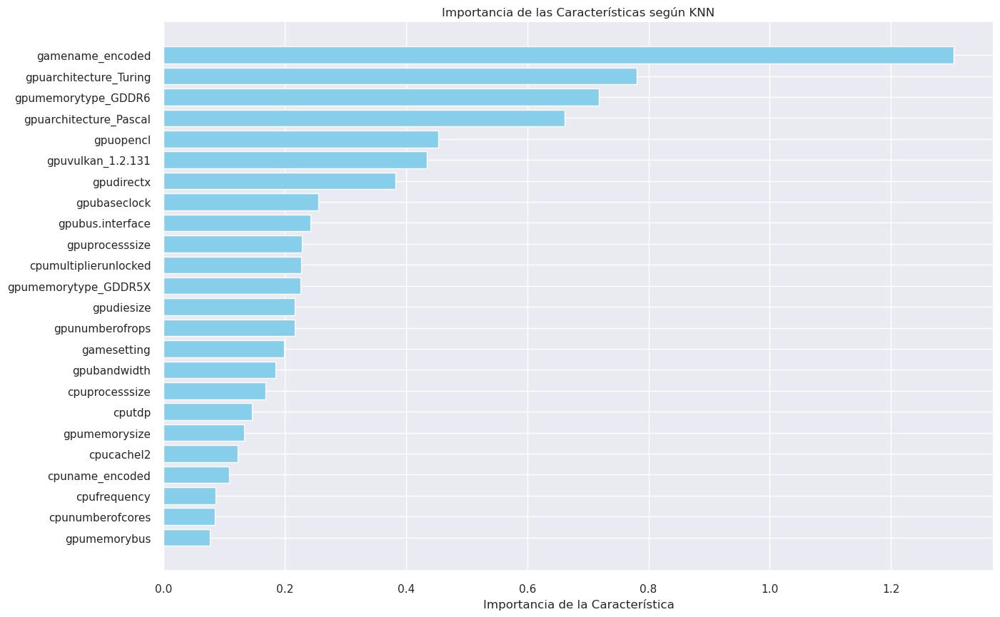

In [ ]:
from sklearn.inspection import permutation_importance

result = permutation_importance(best_knn, X_test_scaled, y_test, n_repeats=1, random_state=42, n_jobs=-1)

feature_importances_df_knn = pd.DataFrame({
    'Feature': X.columns,
    'Index': np.arange(len(X.columns)),
    'KNN Importance': result.importances_mean
})

feature_importances_df_knn = feature_importances_df_knn.sort_values(by='KNN Importance', ascending=False)

plt.figure(figsize=(15, 10))
plt.barh(feature_importances_df_knn['Feature'], feature_importances_df_knn['KNN Importance'], color='skyblue')
plt.xlabel('Importancia de la Característica')
plt.title('Importancia de las Características según KNN')
plt.legend()
plt.gca().invert_yaxis()
plt.show()


Observamos como la característica mas importante es el juego en el que se han realizado las medidas de FPS, por otro lado las caracteristicas mas relevantes  son todas relativas a la GPU sobretodo la arquitectura de dicha unidad.

In [ ]:
distances, indices = best_knn.kneighbors(X_test.iloc[0:1])
print("Distancias a los vecinos más cercanos:", distances)
print("Índices de los vecinos más cercanos:", indices)

Distancias a los vecinos más cercanos: [[256299. 256299. 256299.]]
Índices de los vecinos más cercanos: [[ 7 53 45]]


Observamos como los vecinos tiene una proximidad muy alta.


In [ ]:
show_html(pd.DataFrame(grid_search_knn.cv_results_).loc[:, ['params', 'mean_test_score', 'rank_test_score']].sort_values(by='rank_test_score').head().to_html())
results_df = save_results(grid_search_knn, X_train_scaled, y_train, X_test_scaled, y_test, 'KNN', results_df)

,params,mean_test_score,rank_test_score
0,"{'metric': 'chebyshev', 'n_neighbors': 3, 'weights': 'uniform'}",-102.848,1


Vemos como tenemos el mejor modelo hasta el momento, mejorando en un 2,8% en la métrica R² en el conjunto de prueba y logramos reducir el MSE a más de la mitad y el MAE lo bajamos en 3 puntos respecto a las regresiones simples.

In [ ]:
show_html(results_df.sort_values(by='test R2', ascending=False).to_html())

,train R2,test R2,MSE,MAE
KNN,0.991,0.975,73.563,5.480
Ridge,0.948,0.947,151.584,8.534
LASSO,0.948,0.947,151.584,8.534
Linear Regression,0.948,0.947,151.605,8.535


### SVM lineal

Procedemos ahora a aplicar SVM con kernel lineal, realizando una exploración del parámetro de regularización y la epsilon.

In [ ]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

svm_linear = SVR(kernel='linear')

param_grid = {
    'C': [0.1, 1, 10, 100, 1000],
    'epsilon': [0.1, 0.2, 0.5, 1, 2, 5]
}

grid_search_svm_lineal = GridSearchCV(estimator=svm_linear, param_grid=param_grid, cv=num_folds, scoring='neg_mean_squared_error', n_jobs=-1)

grid_search_svm_lineal.fit(X_train_scaled, y_train)

print("Mejores hiperparámetros encontrados:")
print(grid_search_svm_lineal.best_params_)

best_svm = grid_search_svm_lineal.best_estimator_
y_pred_svm = best_svm.predict(X_test_scaled)

mse_svm = mean_squared_error(y_test, y_pred_svm)
r2_svm = r2_score(y_test, y_pred_svm)

print(f"Mean Squared Error: {mse_svm}")
print(f"R^2 Score: {r2_svm}")

Mejores hiperparámetros encontrados:
{'C': 1, 'epsilon': 5}
Mean Squared Error: 154.1979311654238
R^2 Score: 0.9465787841486849


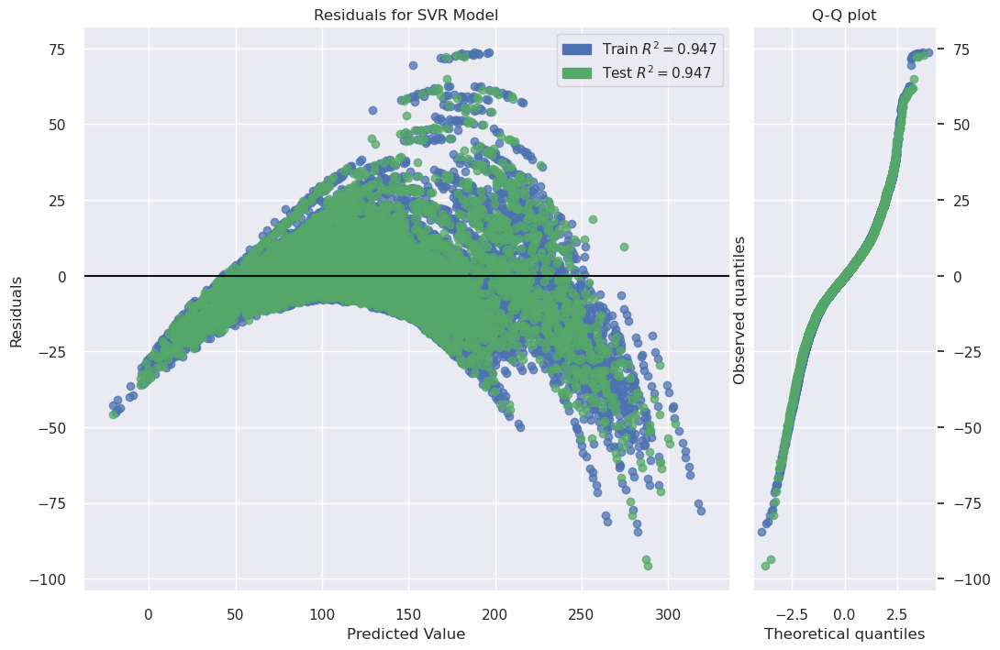

In [ ]:
plt.figure(figsize=(12, 8))
viz = residuals_plot(best_svm, X_train_scaled, y_train, X_test_scaled, y_test, is_fitted=True, qqplot=True, hist=False)

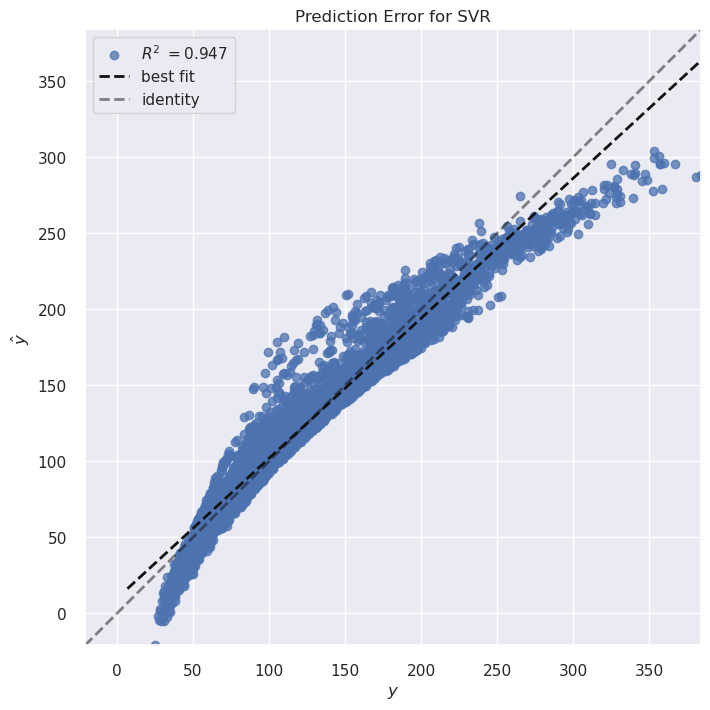

In [ ]:
plt.figure(figsize=(8, 8))
visualizer = prediction_error(best_svm, X_test_scaled, y_test, is_fitted=True)
visualizer.show();

Vemos como tanto el grafico de residuos como el de la predicción del error son muy parecidos a los obtenidos con la regresión linear.

In [ ]:
print("R² Score en el conjunto de entrenamiento:", best_svm.score(X_train_scaled, y_train))
print("R² Score en el conjunto de prueba:", best_svm.score(X_test_scaled, y_test))

R² Score en el conjunto de entrenamiento: 0.9466618497820714
R² Score en el conjunto de prueba: 0.9465787841486849


Vemos como no hay nada de sobreajuste.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


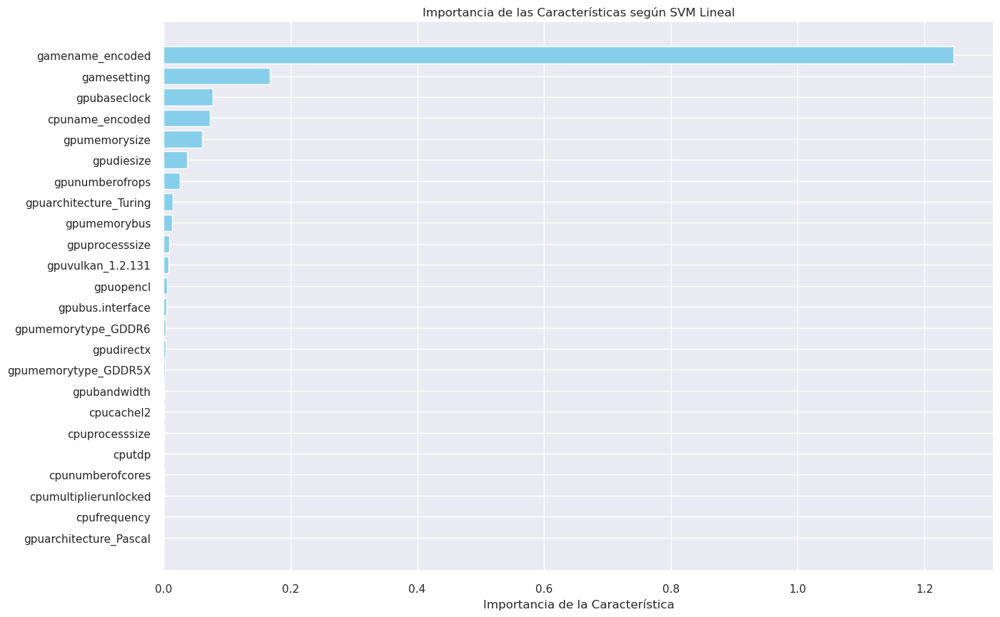

In [ ]:
result = permutation_importance(best_svm, X_test_scaled, y_test, n_repeats=3, random_state=42, n_jobs=-1)

feature_importances_df_svmL = pd.DataFrame({
    'Feature': X.columns,
    'SVM Lineal Importance': result.importances_mean
})

feature_importances_df_svmL = feature_importances_df_svmL.sort_values(by='SVM Lineal Importance', ascending=False)

plt.figure(figsize=(15, 10))
plt.barh(feature_importances_df_svmL['Feature'], feature_importances_df_svmL['SVM Lineal Importance'], color='skyblue')
plt.xlabel('Importancia de la Característica')
plt.title('Importancia de las Características según SVM Lineal')
plt.legend()
plt.gca().invert_yaxis()
plt.show()

Observamos como la variables mas imporatantes son las relativas al juego en cuestion tanto a la configuración como al juego propiamente, por debajo tenemos mayoritariamente variables relativas a la GPU a excepción del nombre de la CPU. Vemos como a partir de la variable número 11, las variables dejan de tener importancia.

In [ ]:
show_html(pd.DataFrame(grid_search_svm_lineal.cv_results_).loc[:, ['params', 'mean_test_score', 'rank_test_score']].sort_values(by='rank_test_score').head().to_html())
results_df = save_results(grid_search_svm_lineal, X_train_scaled, y_train, X_test_scaled, y_test, 'SVM Lineal', results_df)

,params,mean_test_score,rank_test_score
0,"{'C': 1, 'epsilon': 5}",-162.609,1


In [ ]:
show_html(results_df.sort_values(by='test R2', ascending=False).to_html())

,train R2,test R2,MSE,MAE
KNN,0.991,0.975,73.563,5.480
Ridge,0.948,0.947,151.584,8.534
LASSO,0.948,0.947,151.584,8.534
Linear Regression,0.948,0.947,151.605,8.535
SVM Lineal,0.947,0.947,154.198,8.498


Vemos como el modelo es el peor hasta la fecha en cuanto a MSE pese que sea mejor que la mayoría en cuanto al valor absoluto.

### SVM cuadrático

Procedemos seguidamente a aplicar SVM con un kernel polinómico en este caso de grado 2 (cuadŕatico). Para ello exploraremos los mismos valores que en el modelo con kernel lineal.

In [ ]:
svm = SVR(kernel='poly', degree=2)

param_grid = {
    'C': [0.1, 1, 10, 100, 1000],
    'epsilon': [0.1, 0.2, 0.5, 1, 2, 5]
}

grid_search_svm_cuadratico = GridSearchCV(estimator=svm, param_grid=param_grid, cv=num_folds, scoring='neg_mean_squared_error', n_jobs=-1)

grid_search_svm_cuadratico.fit(X_train_scaled, y_train)

print("Mejores hiperparámetros encontrados:")
print(grid_search_svm_cuadratico.best_params_)

best_svm = grid_search_svm_cuadratico.best_estimator_
y_pred_svm = best_svm.predict(X_test_scaled)

mse_svm = mean_squared_error(y_test, y_pred_svm)
r2_svm = r2_score(y_test, y_pred_svm)

print(f"Mean Squared Error: {mse_svm}")
print(f"R^2 Score: {r2_svm}")

Mejores hiperparámetros encontrados:
{'C': 100, 'epsilon': 1}
Mean Squared Error: 6.092095576584354
R^2 Score: 0.9978894194602753


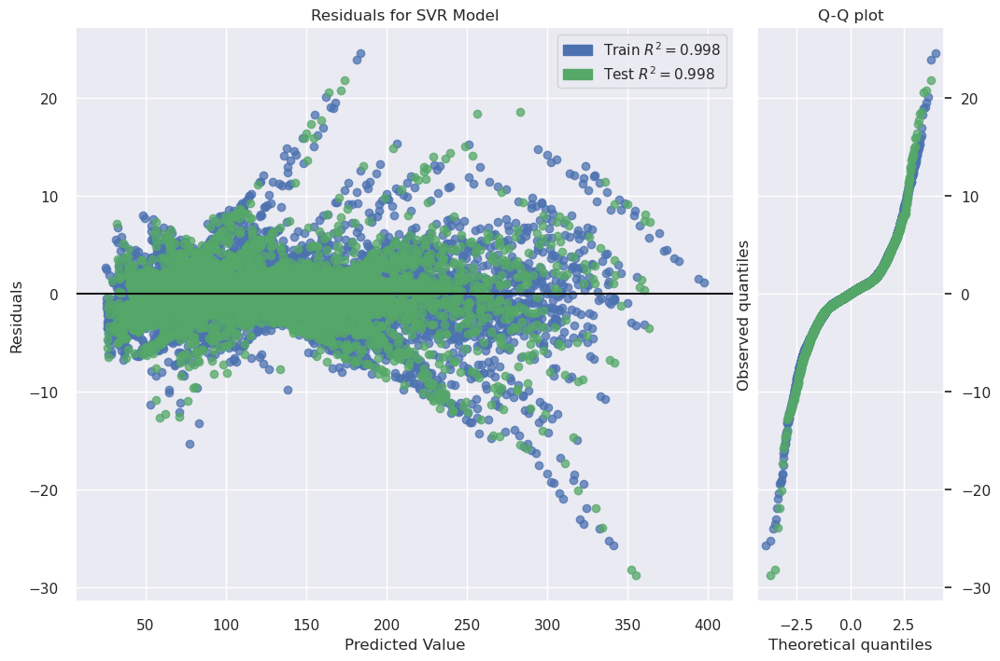

In [ ]:
plt.figure(figsize=(12, 8))
viz = residuals_plot(best_svm, X_train_scaled, y_train, X_test_scaled, y_test, is_fitted=True, qqplot=True, hist=False)

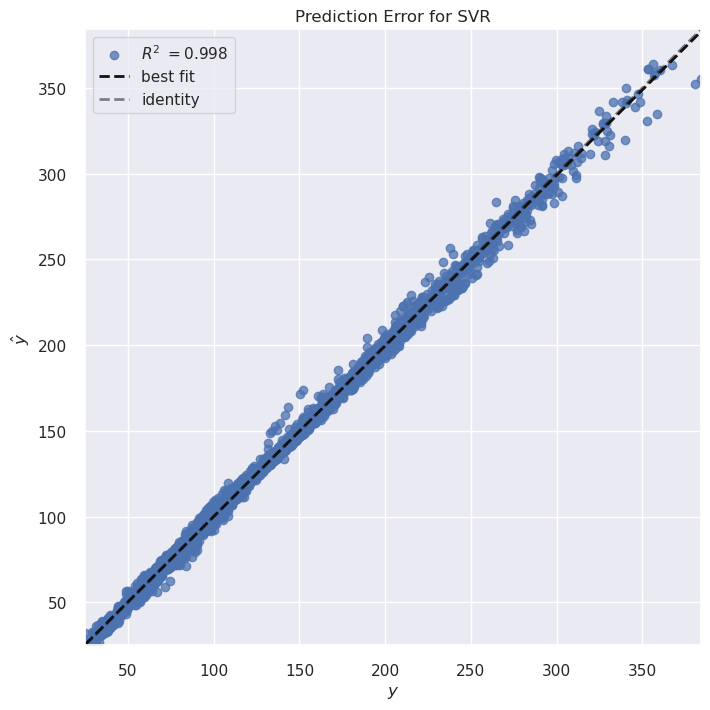

In [ ]:
plt.figure(figsize=(8, 8))
visualizer = prediction_error(best_svm, X_test_scaled, y_test, is_fitted=True)
visualizer.show();

Observamos una distribución con ciertos patrones en el grafo de residuos y vemos como el qq-plot presenta altas curvaturas, sin embargo vemos como obtenemos unos resultados ni mas ni menos que de 99.8% por lo que hace a la métrica de R².

In [ ]:
print("R² Score en el conjunto de entrenamiento:", best_svm.score(X_train_scaled, y_train))
print("R² Score en el conjunto de prueba:", best_svm.score(X_test_scaled, y_test))

R² Score en el conjunto de entrenamiento: 0.9980682961083136
R² Score en el conjunto de prueba: 0.9978894194602753


Observamos por otra parte que el modelo no sobreajusta casi nada, es decir las predicciones parecen ser realmente exitosas al añadir una dimensión extra para transformar los datos con el kernel.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


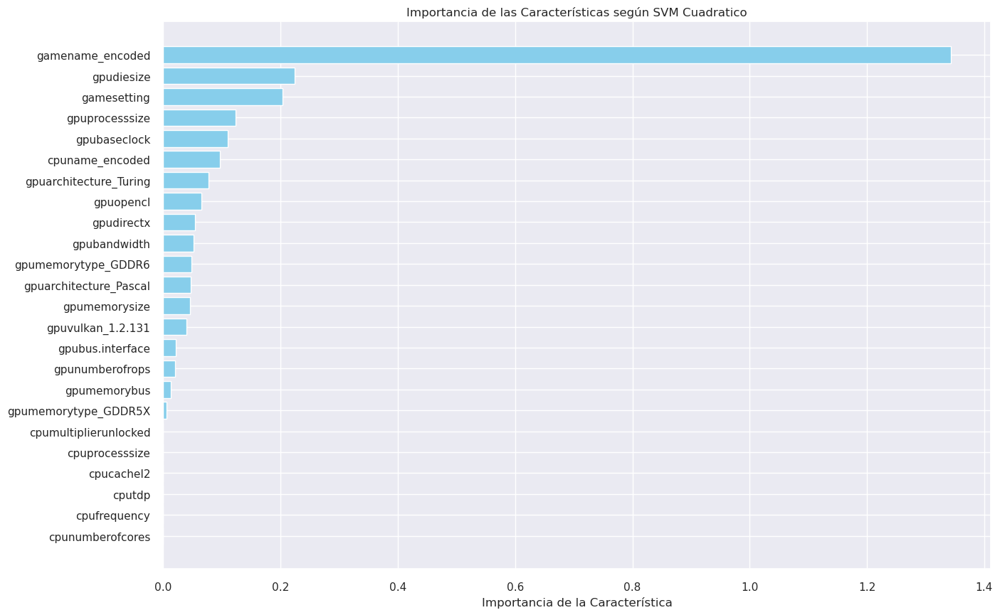

In [ ]:
result = permutation_importance(best_svm, X_test_scaled, y_test, n_repeats=3, random_state=42, n_jobs=-1)

feature_importances_df_svmC = pd.DataFrame({
    'Feature': X.columns,
    'SVM Cuadratico Importance': result.importances_mean
})

feature_importances_df_svmC = feature_importances_df_svmC.sort_values(by='SVM Cuadratico Importance', ascending=False)

plt.figure(figsize=(15, 10))
plt.barh(feature_importances_df_svmC['Feature'], feature_importances_df_svmC['SVM Cuadratico Importance'], color='skyblue')
plt.xlabel('Importancia de la Característica')
plt.title('Importancia de las Características según SVM Cuadratico')
plt.legend()
plt.gca().invert_yaxis()
plt.show()

En relación a las variables observamos que el nombre del juego sigue predominando y las variables relativas a la GPU, en este caso las que no hacen referencia a la arquitectura, son las mas importantes en la predicción de este modelo.

In [ ]:
show_html(pd.DataFrame(grid_search_svm_cuadratico.cv_results_).loc[:, ['params', 'mean_test_score', 'rank_test_score']].sort_values(by='rank_test_score').head().to_html())
results_df = save_results(grid_search_svm_cuadratico, X_train_scaled, y_train, X_test_scaled, y_test, 'SVM Cuadŕatico', results_df)

,params,mean_test_score,rank_test_score
0,"{'C': 100, 'epsilon': 1}",-6.007,1


Observamos que el modelo se coloca en primera posición reduciendo en un factor de casi 1/4 el MAE y en un factor de mas de 1/10 el MSE.

In [ ]:
show_html(results_df.sort_values(by='test R2', ascending=False).to_html())

,train R2,test R2,MSE,MAE
SVM Cuadŕatico,0.998,0.998,6.092,1.485
KNN,0.991,0.975,73.563,5.480
Ridge,0.948,0.947,151.584,8.534
LASSO,0.948,0.947,151.584,8.534
Linear Regression,0.948,0.947,151.605,8.535
SVM Lineal,0.947,0.947,154.198,8.498


## Entrenamiento de modelos no-lineales

Procedemos en este apartado a entrenar distintos modelos no-lineales. Si existen hiperparámetros que ajustar realizamos una exploración adecuada. Como en la sección anterior, hemos decidido tambien realizar experimentos con los 6 modelos propuestos con el fin de encontrar el mejor y ver como se desenvuelven nuestros datos con cada modelo.

Entrenaremos los siguientes 6 modelos lineales/cuadráticos:
- **SVM con kernel RBF**
- **Random Forest**
- **MLP**
- **Gradient Boosting**
- **Voting ensemble (de los tres mejores modelos)**
- **Stacking ensemble (de los tres mejores modelos)**

### SVM con kernel RBF

Volvemos a usar una SVM, pero en este caso usando un kernel RBF que permite capturar relaciones no-lineales. Hemos visto como los modelos lineales ya iban muy bien, pero puede que acabemos de mejorarlos usando modelos no-lineales. Para la búsqueda en el espacio de hiperparámetros usaremos una búsqueda bayesiana en vez de una búsqueda exhaustiva para reducir el tiempo de cómputo.

En SVM suele ser mejor estandarizar los datos, así usaremos la partición estandarizada:

In [ ]:
X_train_scaled = X_train_scaled_STD
X_test_scaled = X_test_scaled_STD

In [ ]:
# Espacio de hiperparametros
param = {
    'C': 10**np.linspace(-3, 3, 101),
    'gamma': ['scale', 'auto'],
    'kernel': ['rbf'],
}

rbsvr = SVR(max_iter=30000)
rbsvr_bs = BayesSearchCV(
    rbsvr,
    param,
    n_iter=n_iter,
    cv=num_folds,
    n_jobs=-1,
    refit=True,
    random_state=0
)

# Entrenamiento
rbsvr_bs.fit(X_train_scaled, y_train)

# Resultados
print("Mejores parámetros:", rbsvr_bs.best_params_)
print("Mejor score:", rbsvr_bs.best_score_)

/home/jordimunoz/jordi/q7/apa/apa_env/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=30000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/jordimunoz/jordi/q7/apa/apa_env/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=30000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/jordimunoz/jordi/q7/apa/apa_env/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=30000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/jordimunoz/jordi/q7/apa/apa_env/lib/python3.12/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=30000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/jordimunoz/jordi/q

Mejores parámetros: OrderedDict({'C': 331.13112148259074, 'gamma': 'auto', 'kernel': 'rbf'})
Mejor score: 0.99992311933422


In [ ]:
show_html(pd.DataFrame(rbsvr_bs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

,params,mean_test_score,rank_test_score
16,"{'C': 331.13112148259074, 'gamma': 'auto', 'kernel': 'rbf'}",1.0,1
11,"{'C': 218.77616239495518, 'gamma': 'auto', 'kernel': 'rbf'}",1.0,2
23,"{'C': 870.9635899560797, 'gamma': 'auto', 'kernel': 'rbf'}",1.0,3
6,"{'C': 660.6934480075951, 'gamma': 'auto', 'kernel': 'rbf'}",1.0,4
5,"{'C': 109.64781961431851, 'gamma': 'auto', 'kernel': 'rbf'}",1.0,5


Vemos como los resultados son muy buenos, y los 5 mejores conjuntos de hiperparámetros dan aparentemente un mismo resultado. Lo que podemos hacer ahora es observar los residuos y las predicciones frente a los valores reales:

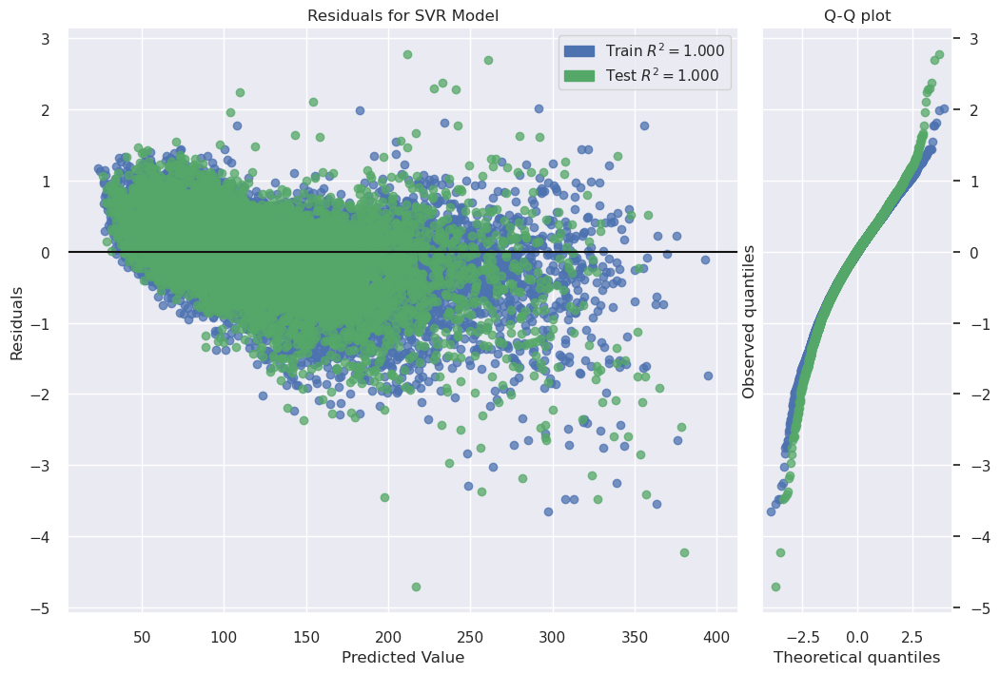

In [ ]:
best_svm = rbsvr_bs.best_estimator_

plt.figure(figsize=(12, 8))
viz = residuals_plot(best_svm, X_train_scaled, y_train, X_test_scaled, y_test, is_fitted=True, qqplot=True, hist=False)

Tanto en la partición de train con validación cruzada como en la partición de test el modelo es muy bueno.

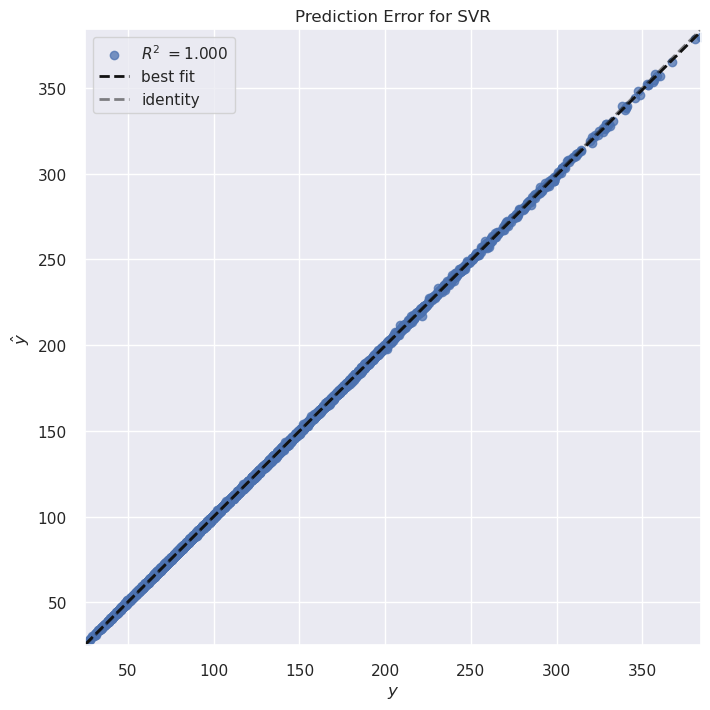

In [ ]:
plt.figure(figsize=(8, 8))
visualizer = prediction_error(best_svm, X_test_scaled, y_test, is_fitted=True)
visualizer.show();

El modelo es muy bueno, no se ha sobreajustado y se sigue prácticamente la recta identidad. Será complicado mejorar este resultado.

Algo interesante que podemos intentar hacer es calcular la permutation_importance en la partición de test para observar que atributos son mas importantes en el modelo:

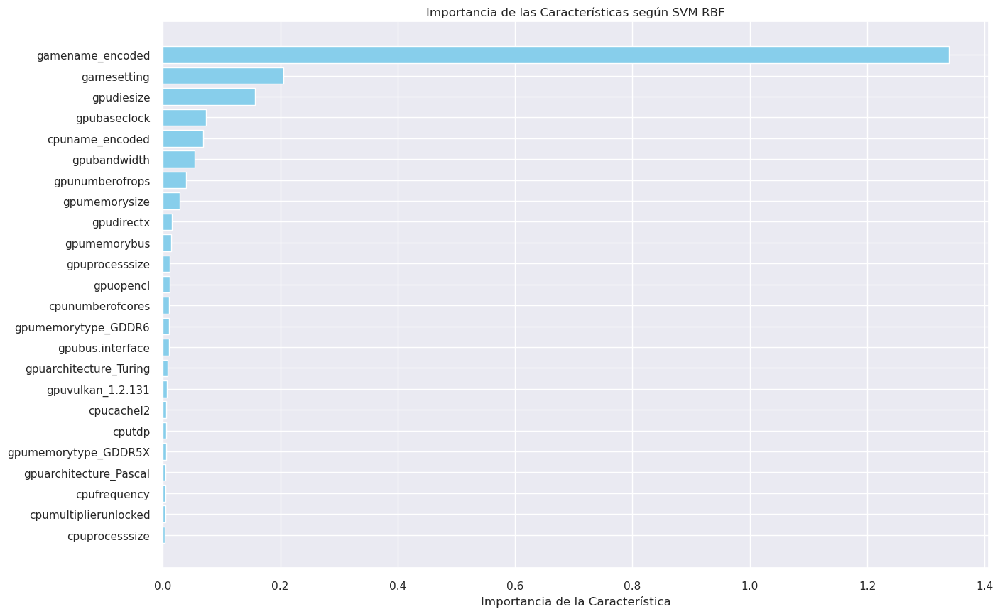

In [ ]:
result = permutation_importance(best_svm, X_test_scaled, y_test, n_repeats=3, random_state=42, n_jobs=-1)

feature_importances_df_svm = pd.DataFrame({
    'Feature': X.columns,
    'SVM RBF Importance': result.importances_mean
})

feature_importances_df_svm = feature_importances_df_svm.sort_values(by='SVM RBF Importance', ascending=False)

plt.figure(figsize=(15, 10))
plt.barh(feature_importances_df_svm['Feature'], feature_importances_df_svm['SVM RBF Importance'], color='skyblue')
plt.xlabel('Importancia de la Característica')
plt.title('Importancia de las Características según SVM RBF')
plt.gca().invert_yaxis()
plt.show()

Vemos como de nuevo el atributo con mayor importancia es con diferencia gamename_encoded.

In [ ]:
results_df = save_results(rbsvr_bs, X_train_scaled, y_train, X_test_scaled, y_test, 'SVM RBF', results_df)
show_html(results_df.sort_values(by='test R2', ascending=False).to_html())

,train R2,test R2,MSE,MAE
SVM RBF,1.000,1.000,0.303,0.408
SVM Cuadŕatico,0.998,0.998,6.092,1.485
KNN,0.991,0.975,73.563,5.480
Ridge,0.948,0.947,151.584,8.534
LASSO,0.948,0.947,151.584,8.534
Linear Regression,0.948,0.947,151.605,8.535
SVM Lineal,0.947,0.947,154.198,8.498


Se ve claramente como es el mejor modelo encontrado hasta el momento, llegando a un MAE de 0.4 FPS, lo qual es extremadamente bajo.

### Random Forest

Ahora entrenaremos un Random Forest. En este modelo no es necesario estandarizar/normalizar los datos, ya que está basado en árboles de decisión:

In [ ]:
param = {
    'n_estimators': [5, 10, 25, 50, 100, 200],
    'criterion': ['squared_error', 'absolute_error'],
    'max_depth': [None, 1, 2, 3, 5, 8, 10, 15],
    'min_samples_leaf': [1, 2, 3, 5, 10]
}

rf = RandomForestRegressor(random_state=0)
rf_bs = BayesSearchCV(
    estimator=rf,
    search_spaces=param,
    n_iter=n_iter,
    cv=num_folds,
    n_jobs=-1,
    refit=True,
    random_state=0
)

# Entrenamiento
rf_bs.fit(X_train, y_train)

# Resultados
print("Mejores parámetros:", rf_bs.best_params_)
print("Mejor score:", rf_bs.best_score_)

Mejores parámetros: OrderedDict({'criterion': 'squared_error', 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 200})
Mejor score: 0.997749410986749


In [ ]:
show_html(pd.DataFrame(rf_bs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

,params,mean_test_score,rank_test_score
10,"{'criterion': 'squared_error', 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 200}",0.998,1
12,"{'criterion': 'squared_error', 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}",0.998,2
14,"{'criterion': 'squared_error', 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 50}",0.998,3
18,"{'criterion': 'squared_error', 'max_depth': 15, 'min_samples_leaf': 1, 'n_estimators': 200}",0.998,4
24,"{'criterion': 'absolute_error', 'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 25}",0.997,5


Observamos de nuevo resultados muy buenos en la partición de train con validacion cruzada. Podemos de nuevo ver los residuos y las predicciones frente a los valores reales para tratar de ver que el modelo no se haya sobreajustado.

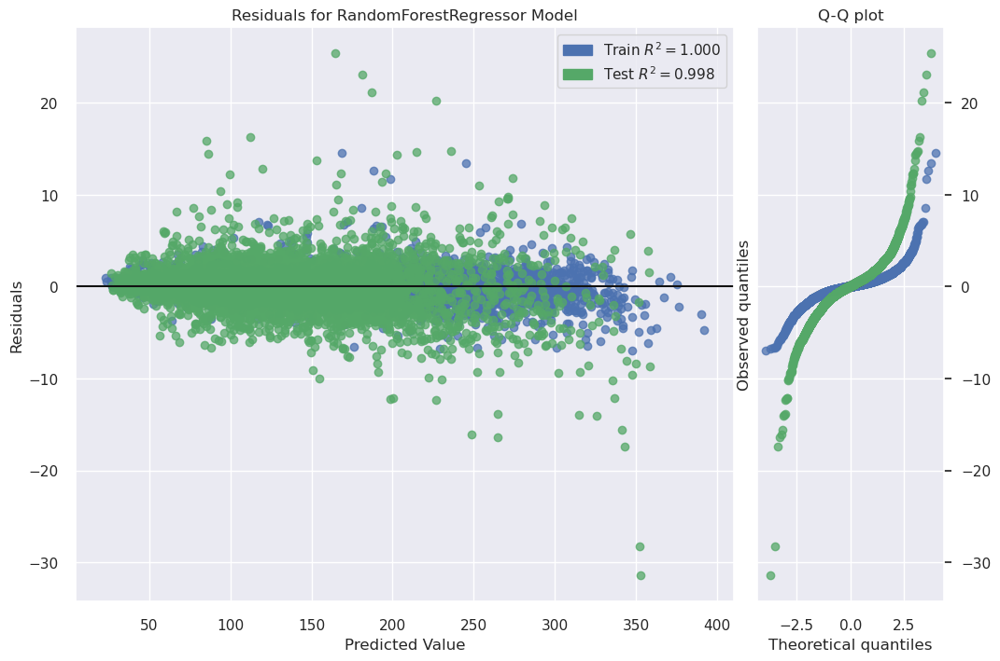

In [ ]:
best_rf = rf_bs.best_estimator_

plt.figure(figsize=(12, 8))
viz = residuals_plot(best_rf, X_train, y_train, X_test, y_test, is_fitted=True, qqplot=True, hist=False)

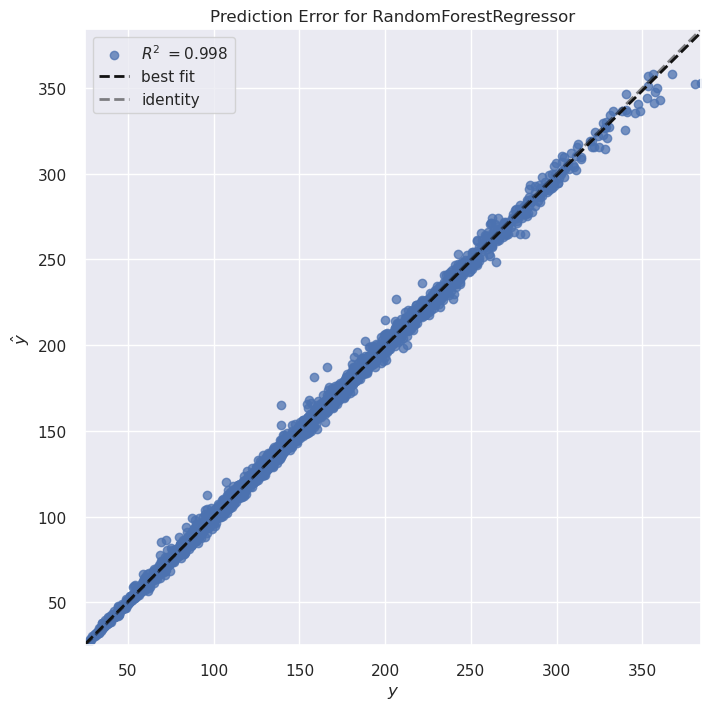

In [ ]:
plt.figure(figsize=(8, 8))
visualizer = prediction_error(best_rf, X_test, y_test, is_fitted=True)
visualizer.show();

Vemos como el modelo es bueno, pero sigue siendo peor que SVM con kernel RBF. Finalmente, nos queda intentar interpretar la importancia que da Random Forest a los atributos:

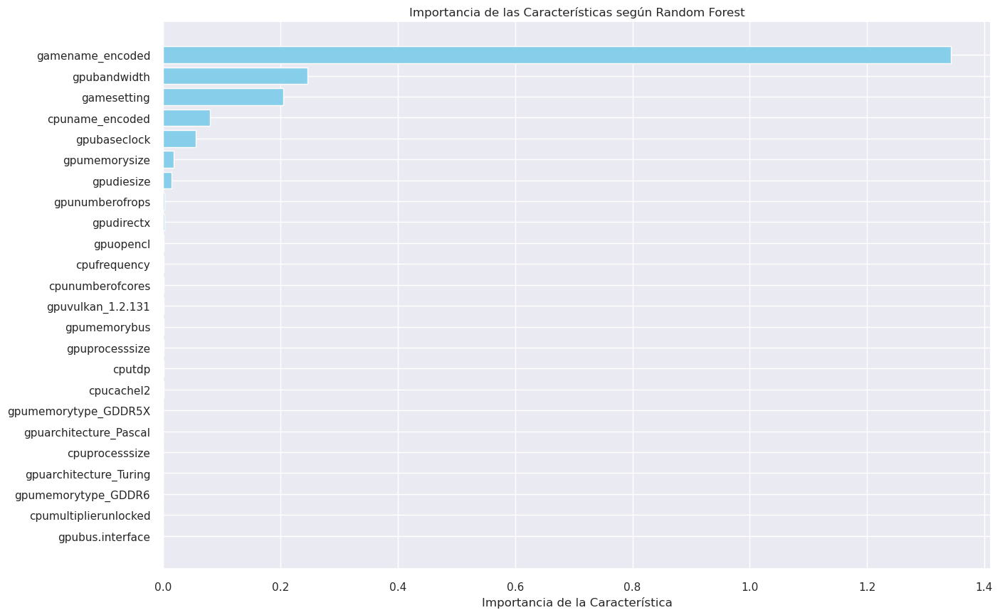

In [ ]:
result = permutation_importance(best_rf, X_test, y_test, n_repeats=3, random_state=42, n_jobs=-1)

feature_importances_df_rf = pd.DataFrame({
    'Feature': X.columns,
    'Random Forest Importance': result.importances_mean
})

feature_importances_df_rf = feature_importances_df_rf.sort_values(by='Random Forest Importance', ascending=False)

plt.figure(figsize=(15, 10))
plt.barh(feature_importances_df_rf['Feature'], feature_importances_df_rf['Random Forest Importance'], color='skyblue')
plt.xlabel('Importancia de la Característica')
plt.title('Importancia de las Características según Random Forest')
plt.gca().invert_yaxis()
plt.show()

Observamos algo muy similar a los modelos anteriores. Queda claro que el atriburo mas importante en nuestro problema es claramente gamename_encoded.

In [ ]:
results_df = save_results(rf_bs, X_train, y_train, X_test, y_test, 'Random Forest', results_df)
show_html(results_df.sort_values(by='test R2', ascending=False).to_html())

,train R2,test R2,MSE,MAE
SVM RBF,1.000,1.000,0.303,0.408
Random Forest,1.000,0.998,4.945,1.402
SVM Cuadŕatico,0.998,0.998,6.092,1.485
KNN,0.991,0.975,73.563,5.480
Ridge,0.948,0.947,151.584,8.534
LASSO,0.948,0.947,151.584,8.534
Linear Regression,0.948,0.947,151.605,8.535
SVM Lineal,0.947,0.947,154.198,8.498


## MLP

Bien, vamos a probar también con una red nueronal explorando adecuadamente los hiperparámetros. En MLP suele ser habitual usar los datos estandarizados.

In [ ]:
X_train_scaled = X_train_scaled_STD
X_test_scaled = X_test_scaled_STD

In [ ]:
param = {
    'hidden_layer_sizes': [10, 50, 100, 200],
    'activation': ['relu', 'logistic', 'identity'],
    'learning_rate_init': [0.001, 0.01, 0.1]
}

mlp = MLPRegressor(
    max_iter=10000,
    early_stopping=True,
    n_iter_no_change=20,
    learning_rate='adaptive',
    random_state=0
)

mlp_gs = GridSearchCV(
    estimator=mlp,
    param_grid=param,
    cv=num_folds,
    n_jobs=-1,
    refit=True
)

# Entrenamiento del modelo
mlp_gs.fit(X_train_scaled, y_train)

# Resultados
print("Mejores parámetros:", mlp_gs.best_params_)
print("Mejor score:", mlp_gs.best_score_)

Mejores parámetros: {'activation': 'relu', 'hidden_layer_sizes': 200, 'learning_rate_init': 0.01}
Mejor score: 0.9996144546168223


In [ ]:
show_html(pd.DataFrame(mlp_gs.cv_results_).loc[:,['params', 'mean_test_score','rank_test_score']].sort_values(by='rank_test_score').head().to_html())

,params,mean_test_score,rank_test_score
10,"{'activation': 'relu', 'hidden_layer_sizes': 200, 'learning_rate_init': 0.01}",1.000,1
11,"{'activation': 'relu', 'hidden_layer_sizes': 200, 'learning_rate_init': 0.1}",0.999,2
22,"{'activation': 'logistic', 'hidden_layer_sizes': 200, 'learning_rate_init': 0.01}",0.999,3
8,"{'activation': 'relu', 'hidden_layer_sizes': 100, 'learning_rate_init': 0.1}",0.999,4
23,"{'activation': 'logistic', 'hidden_layer_sizes': 200, 'learning_rate_init': 0.1}",0.999,5


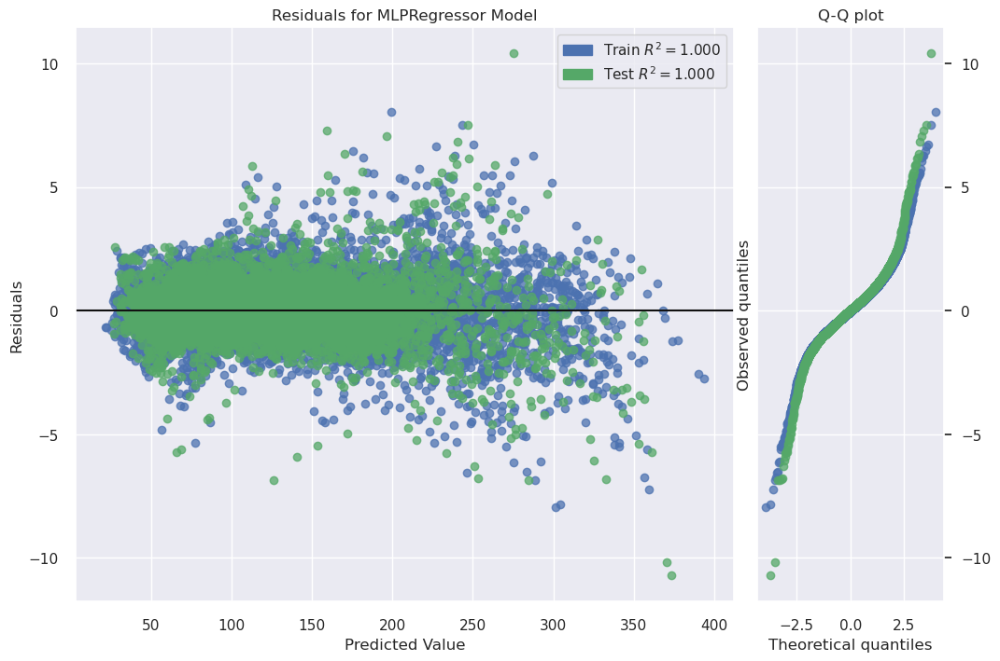

In [ ]:
best_mlp = mlp_gs.best_estimator_

plt.figure(figsize=(12, 8))
viz = residuals_plot(best_mlp, X_train_scaled, y_train, X_test_scaled, y_test, is_fitted=True, qqplot=True, hist=False)

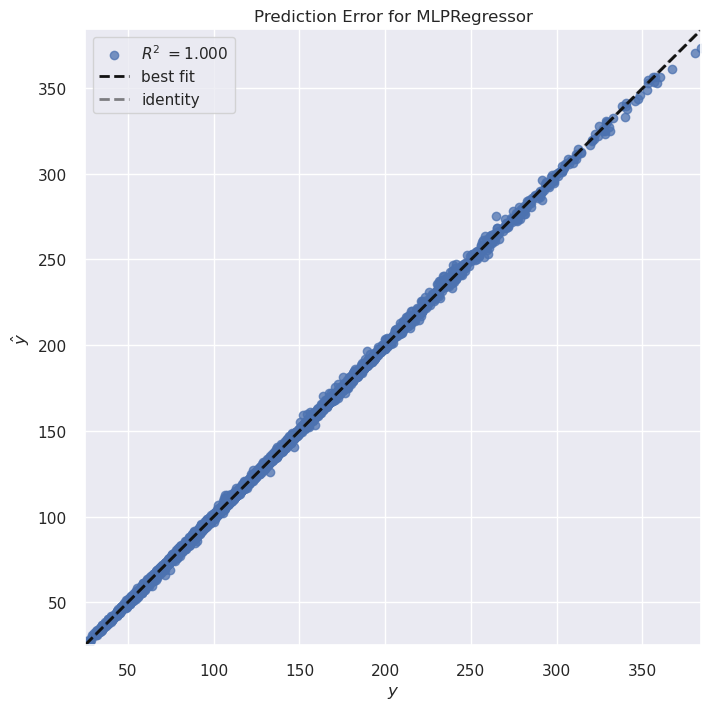

In [ ]:
plt.figure(figsize=(8, 8))
visualizer = prediction_error(best_mlp, X_test_scaled, y_test, is_fitted=True)
visualizer.show();

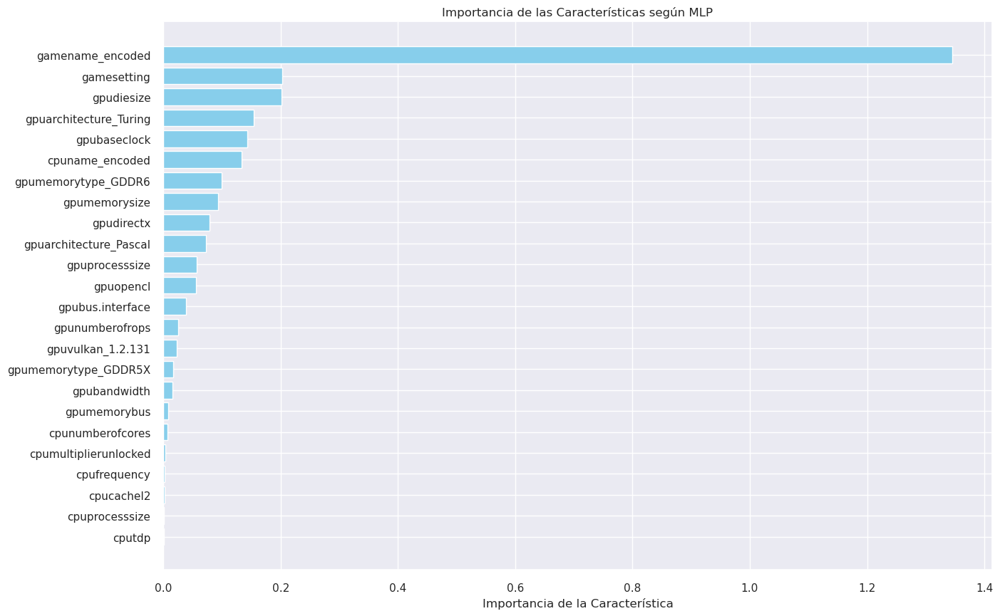

In [ ]:
result = permutation_importance(best_mlp, X_test_scaled, y_test, n_repeats=3, random_state=42, n_jobs=-1)

feature_importances_df_mlp = pd.DataFrame({
    'Feature': X.columns,
    'MLP Importance': result.importances_mean
})

feature_importances_df_mlp = feature_importances_df_mlp.sort_values(by='MLP Importance', ascending=False)

plt.figure(figsize=(15, 10))
plt.barh(feature_importances_df_mlp['Feature'], feature_importances_df_mlp['MLP Importance'], color='skyblue')
plt.xlabel('Importancia de la Característica')
plt.title('Importancia de las Características según MLP')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
results_df = save_results(mlp_gs, X_train_scaled, y_train, X_test_scaled, y_test, 'MLP', results_df)
show_html(results_df.sort_values(by='test R2', ascending=False).to_html())

,train R2,test R2,MSE,MAE
SVM RBF,1.000,1.000,0.303,0.408
MLP,1.000,1.000,1.115,0.724
Random Forest,1.000,0.998,4.945,1.402
SVM Cuadŕatico,0.998,0.998,6.092,1.485
KNN,0.991,0.975,73.563,5.480
Ridge,0.948,0.947,151.584,8.534
LASSO,0.948,0.947,151.584,8.534
Linear Regression,0.948,0.947,151.605,8.535
SVM Lineal,0.947,0.947,154.198,8.498


MLP resulta ser un modelo muy bueno que tampoco se sobreajusta, pero es ligeramente peor que la SVM con kernel RBF, con un MAE de 0.7 FPS aproximadamente.

### Gradient Boosting

En relación a los modelos de acelaración del gradiente, debatimos si usar modelos como el LightGBM o el CatBoost. Sinn embargo, finalmente hemos decidido
usar XGBoost, dado que nuestro conjunto de datos no era tan grande como para
que viesemos una mejora de rendimiento con LightGBM respecto los XGBoost y
por otra el CatBoost nos hacia trabajar con otro conjunto de datos preprocesados y como fuimos viendo que el conjunto preprocesado incial ya obtenia resultados muy buenos, decidimos mantener coherencia y cohesi´on en cuanto al conjunto de datos para comparar modelos.

Así que procedemos con el modelo por excelencia, el XGBoost, realizando una exploración de la profundidad máxima, del número de estimadores y de la tasa de aprendizaje.

In [ ]:
xgb = XGBRegressor()

param_grid = {
    'max_depth': [3, 5, 7, 9],
    'n_estimators': [100, 200, 300, 400, 500],
    'learning_rate': [0.01, 0.1, 0.2, 0.3, 0.5]
}

grid_search_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=num_folds, scoring='neg_mean_squared_error', n_jobs=-1)

grid_search_xgb.fit(X_train_scaled, y_train)

print("Mejores hiperparámetros encontrados:")
print(grid_search_xgb.best_params_)

best_xgb = grid_search_xgb.best_estimator_
y_pred_xgb = best_xgb.predict(X_test_scaled)

mse_xgb = mean_squared_error(y_test, y_pred_xgb)
r2_xgb = r2_score(y_test, y_pred_xgb)

print(f"Mean Squared Error: {mse_xgb}")
print(f"R^2 Score: {r2_xgb}")

Mejores hiperparámetros encontrados:
{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
Mean Squared Error: 1.0076609325408248
R^2 Score: 0.9996509001659403


Observamos como el modelo no permite muchos niveles sin embargo usa muchos estimadores para la predicción.

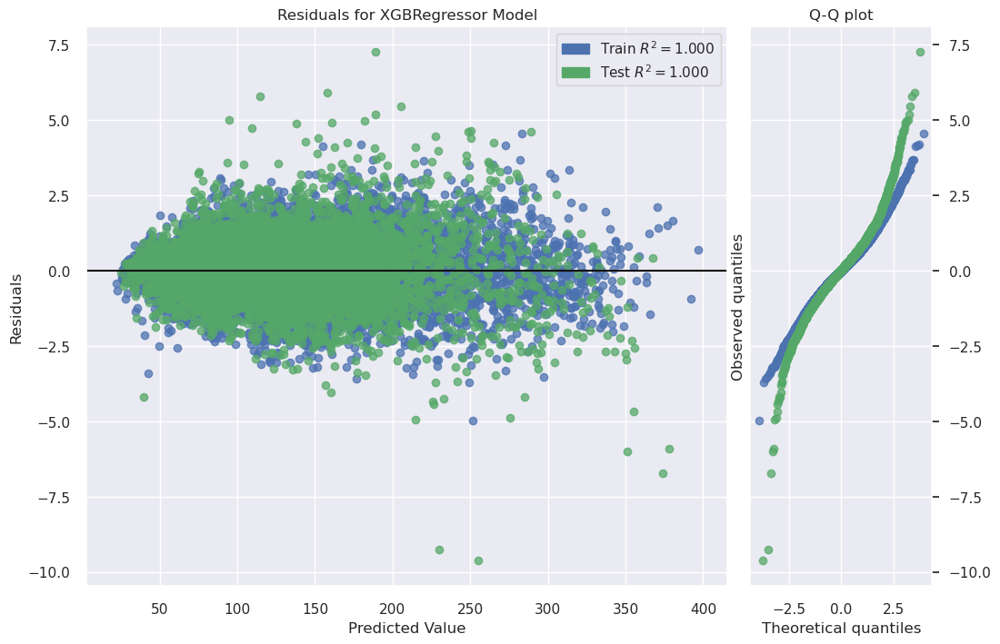

In [ ]:
plt.figure(figsize=(12, 8))
viz = residuals_plot(best_xgb, X_train_scaled, y_train, X_test_scaled, y_test, is_fitted=True, qqplot=True, hist=False)

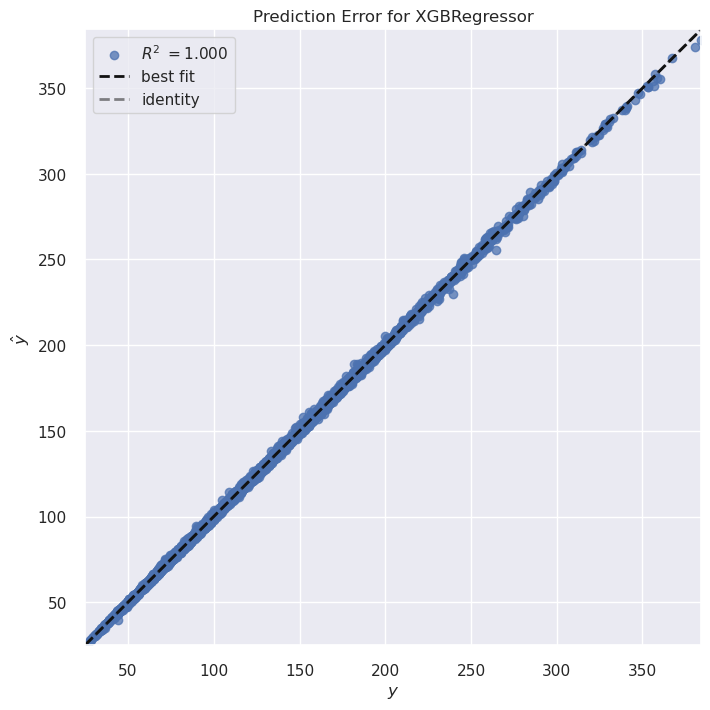

In [ ]:
plt.figure(figsize=(8, 8))
visualizer = prediction_error(best_xgb, X_test_scaled, y_test, is_fitted=True)

In [ ]:
print("R² Score en el conjunto de entrenamiento:", best_xgb.score(X_train_scaled, y_train))
print("R² Score en el conjunto de prueba:", best_xgb.score(X_test_scaled, y_test))

R² Score en el conjunto de entrenamiento: 0.9997854527049824
R² Score en el conjunto de prueba: 0.9996509001659403


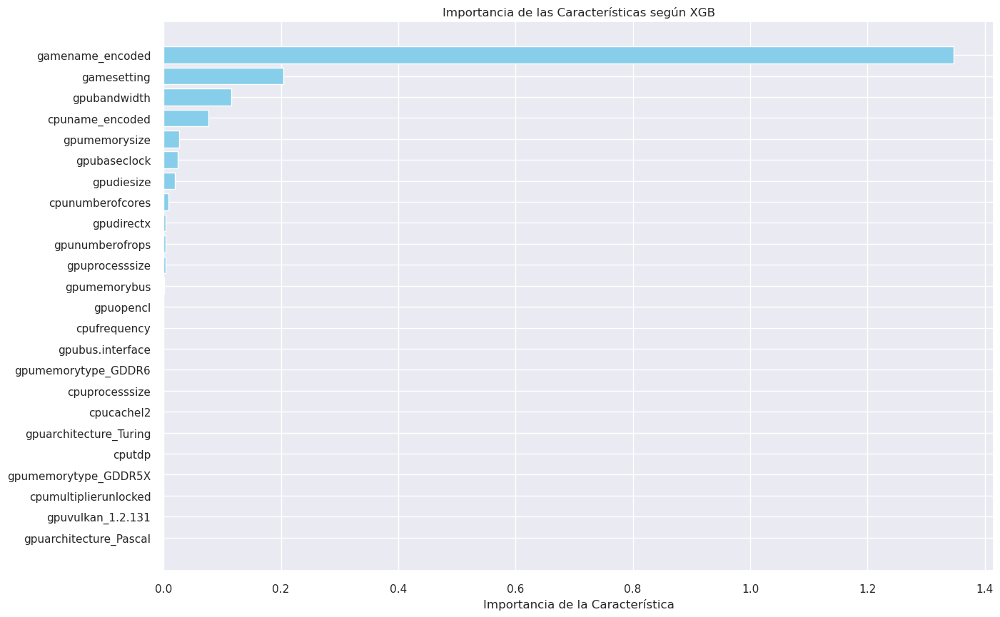

In [ ]:
result = permutation_importance(best_xgb, X_test_scaled, y_test, n_repeats=3, random_state=42, n_jobs=-1)

feature_importances_df_xgb = pd.DataFrame({
    'Feature': X.columns,
    'XGB Importance': result.importances_mean
})

feature_importances_df_xgb = feature_importances_df_xgb.sort_values(by='XGB Importance', ascending=False)

plt.figure(figsize=(15, 10))
plt.barh(feature_importances_df_xgb['Feature'], feature_importances_df_xgb['XGB Importance'], color='skyblue')
plt.xlabel('Importancia de la Característica')
plt.title('Importancia de las Características según XGB')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
show_html(pd.DataFrame(grid_search_xgb.cv_results_).loc[:, ['params', 'mean_test_score', 'rank_test_score']].sort_values(by='rank_test_score').head().to_html())
results_df = save_results(grid_search_xgb, X_train_scaled, y_train, X_test_scaled, y_test, 'XGB', results_df)

,params,mean_test_score,rank_test_score
29,"{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}",-1.143,1
49,"{'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 500}",-1.182,2
69,"{'learning_rate': 0.3, 'max_depth': 5, 'n_estimators': 500}",-1.257,3
34,"{'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 500}",-1.337,4
28,"{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 400}",-1.354,5


In [ ]:
show_html(results_df.sort_values(by='test R2', ascending=False).to_html())

,train R2,test R2,MSE,MAE
SVM RBF,1.000,1.000,0.303,0.408
XGB,1.000,1.000,1.008,0.727
MLP,1.000,1.000,1.115,0.724
Random Forest,1.000,0.998,4.945,1.402
SVM Cuadŕatico,0.998,0.998,6.092,1.485
KNN,0.991,0.975,73.563,5.480
Ridge,0.948,0.947,151.584,8.534
LASSO,0.948,0.947,151.584,8.534
Linear Regression,0.948,0.947,151.605,8.535
SVM Lineal,0.947,0.947,154.198,8.498


Tras aplicar la búsqueda, hemos obtenido una R² de 0.99965 un MSE de 1.007 y un
MAE de 0.727, lo que nos deja a este modelo como el segundo mejor clasificado por
debajo del SVM RBF, respecto el gráfico de residuos observamos una nube de puntos
bastante éliptica y respecto el qq-plot, vemos como en el conjunto de entrenamiento
observamos una linealidad bastante mas aceptable que con el conjunto de prueba.
Y finalmente vemos comparando la R² del conjunto de entrenamiento 0.99978, con
la del conjunto de prueba, 0.99965, que no hay una sobreespecialización notoria.

### Voting Regressor

Como primer modelo de ensamble tenemos un Voting usando los 3 modelos con mejores resultados en cuanto a MSE.

In [ ]:
best_svm_rbf = rbsvr_bs.best_estimator_
best_mlp = mlp_gs.best_estimator_

voting = VotingRegressor(estimators=[
    ('svm_rbf', best_svm_rbf),
    ('mlp', best_mlp),
    ('xgb', best_xgb)
])

voting.fit(X_train_scaled, y_train)

y_pred_voting = voting.predict(X_test_scaled)

mse_voting = mean_squared_error(y_test, y_pred_voting)
r2_voting = r2_score(y_test, y_pred_voting)

print(f"Mean Squared Error: {mse_voting}")
print(f"R^2 Score: {r2_voting}")

Mean Squared Error: 0.3363105085568377
R^2 Score: 0.9998834866581225


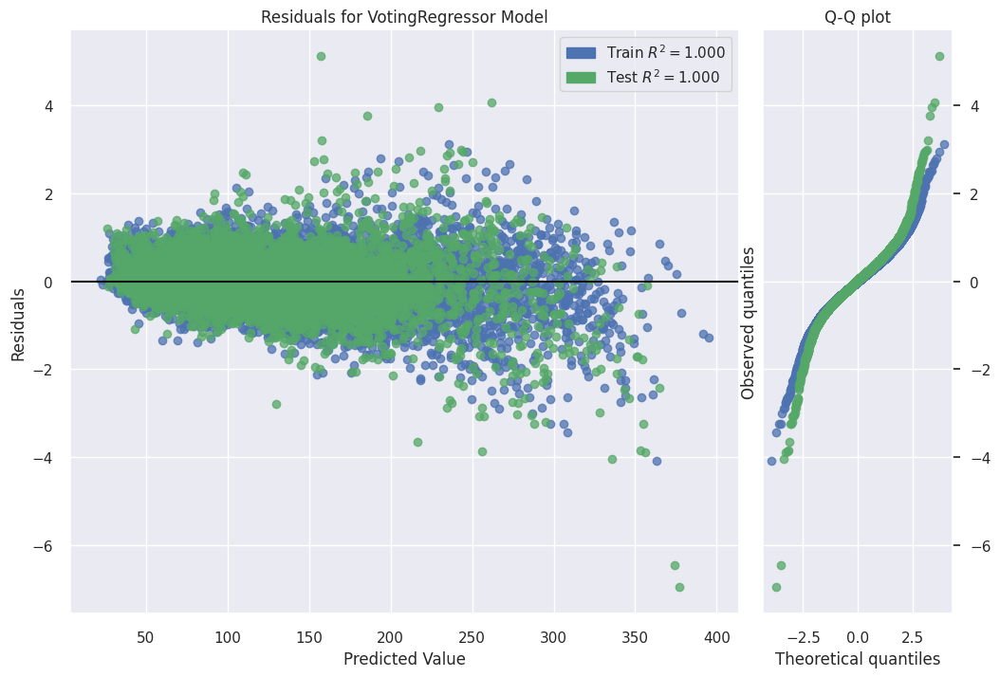

In [ ]:
plt.figure(figsize=(12, 8))
viz = residuals_plot(voting, X_train_scaled, y_train, X_test_scaled, y_test, is_fitted=True, qqplot=True, hist=False)

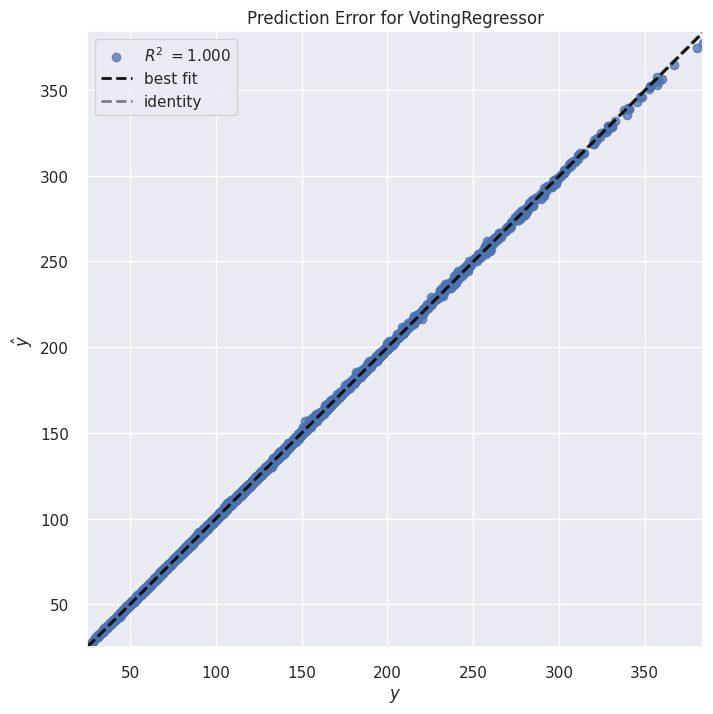

In [ ]:
plt.figure(figsize=(8, 8))
visualizer = prediction_error(voting, X_test_scaled, y_test, is_fitted=True)

Tras mostrar el grafo de residuos y el qq-plot, vemos como la métrica R² obtenida es realmente alta, se redonde a 1 pero realmente es de 0.99988. Vemos como el grafico de residuos tiene una nube de puntos parecida a una elipse con mas anchura que altura y que hay algunos outliers y en el qq-plot vemos como la distribución no es muy gaussiana, presenciamos cierta curvatura en ambas colas

In [ ]:
ensamble_results_df = pd.DataFrame()

ensamble_results_df = save_results(voting, X_train_scaled, y_train, X_test_scaled, y_test, 'Voting Regressor', ensamble_results_df)

In [ ]:
show_html(ensamble_results_df.sort_values(by='test R2', ascending=False).to_html())

,train R2,test R2,MSE,MAE
Voting Regressor,1.0,1.0,0.336,0.406


Vemos por otra parte que el MSE sube 0.033 puntos respecto al mejor modelo previo (SVM RBF), sin embargo el MAE se reduce en 0.002 puntos.

### Stacking Regressor

Por lo que hace al modelo de stacking, hemos probado con dos meta-modelos distintos y hemos visto que el mejor era con una Regresión lineal, con un grafo de residuos con un poco mas de errores en los valores mas altos de FPS, pero con una nube de puntos bastante elíptica y el qq-plot vemos como se ajusta bastante mas a una recta dado que las curvarturas presenciadas en los previos modelos aparecen bastante mas suavizadas.

In [ ]:
from sklearn.ensemble import StackingRegressor

stacking = StackingRegressor(estimators=[
    ('svm_rbf', best_svm_rbf),
    ('mlp', best_mlp),
    ('xgb', best_xgb)
], final_estimator=RandomForestRegressor(random_state=42, n_estimators=100))

stacking.fit(X_train_scaled, y_train)

y_pred_stacking = stacking.predict(X_test_scaled)

mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f"Mean Squared Error: {mse_stacking}")
print(f"R^2 Score: {r2_stacking}")

Mean Squared Error: 0.2722433615322127
R^2 Score: 0.999905682448068


In [ ]:
stacking = StackingRegressor(estimators=[
    ('svm_rbf', best_svm_rbf),
    ('mlp', best_mlp),
    ('xgb', best_xgb)
], final_estimator=LinearRegression())

stacking.fit(X_train_scaled, y_train)

y_pred_stacking = stacking.predict(X_test_scaled)

mse_stacking = mean_squared_error(y_test, y_pred_stacking)
r2_stacking = r2_score(y_test, y_pred_stacking)

print(f"Mean Squared Error: {mse_stacking}")
print(f"R^2 Score: {r2_stacking}")

Mean Squared Error: 0.2278098186054972
R^2 Score: 0.9999210762595789


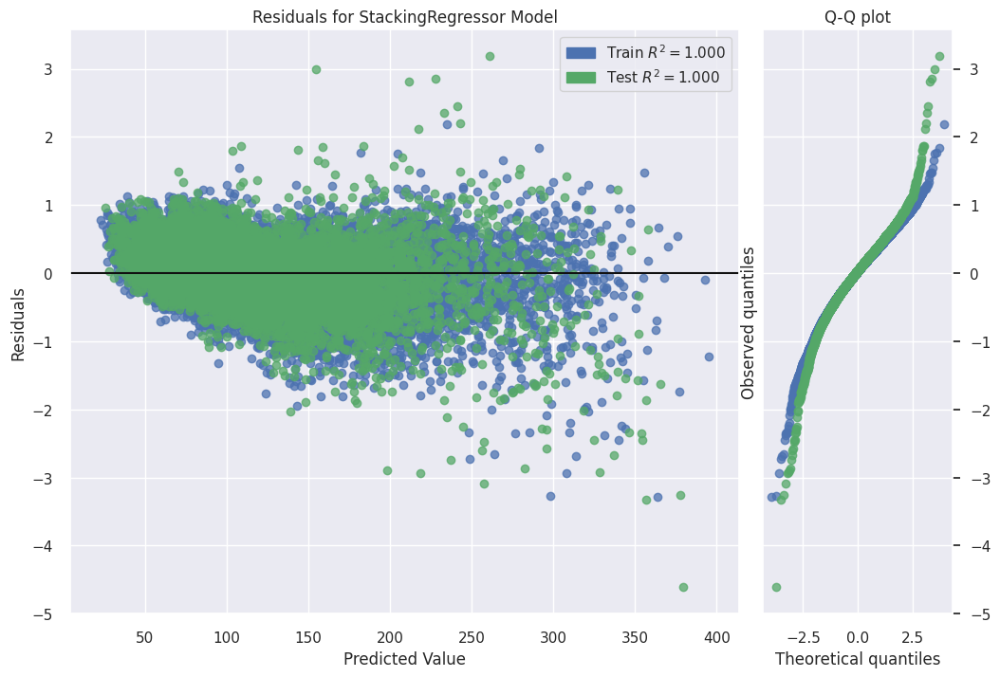

In [ ]:
plt.figure(figsize=(12, 8))
viz = residuals_plot(stacking, X_train_scaled, y_train, X_test_scaled, y_test, is_fitted=True, qqplot=True, hist=False)

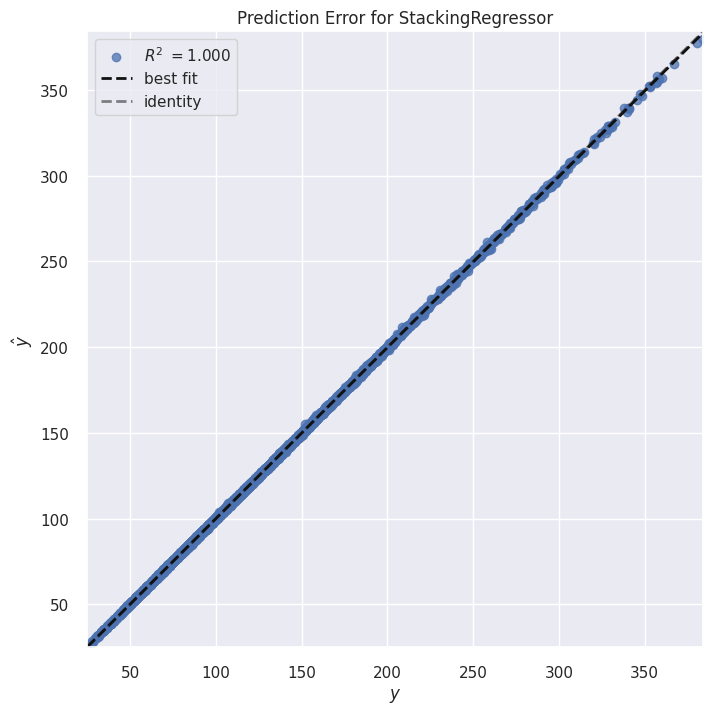

In [ ]:
plt.figure(figsize=(8, 8))
visualizer = prediction_error(stacking, X_test_scaled, y_test, is_fitted=True)

In [ ]:
ensamble_results_df = save_results(stacking, X_train_scaled, y_train, X_test_scaled, y_test, 'Stacking Regressor', ensamble_results_df)

In [ ]:
show_html(ensamble_results_df.sort_values(by='test R2', ascending=False).to_html())

,train R2,test R2,MSE,MAE
Stacking Regressor,1.0,1.0,0.228,0.350
Voting Regressor,1.0,1.0,0.336,0.406


Vemos como efectivamente, en referencia a las mètricas, obtenemos una reducción de 0.078 puntos en el MSE y de 0.058 en el MAE, resultando en el mejor modelo con una métrica R² de 0.99992.

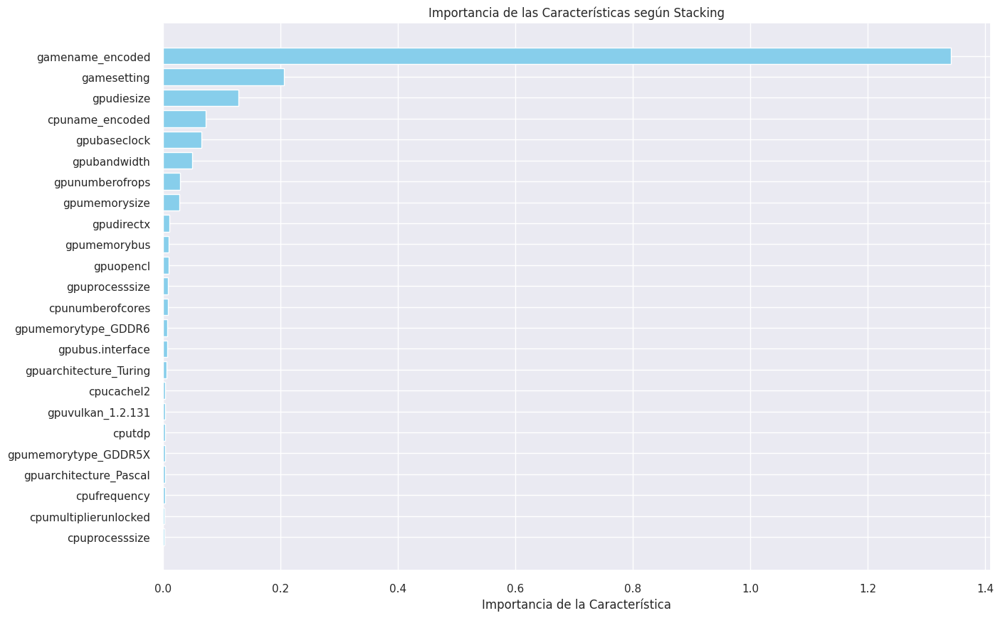

In [ ]:
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import pandas as pd

# Asumiendo que stacking es tu modelo de stacking
result = permutation_importance(stacking, X_test_scaled, y_test, n_repeats=3, random_state=42, n_jobs=-1)

# Crear un DataFrame para visualizar la importancia de las características
feature_importances_df_stacking = pd.DataFrame({
    'Feature': X.columns,
    'Stacking Importance': result.importances_mean
})

# Ordenar las características por importancia
feature_importances_df_stacking = feature_importances_df_stacking.sort_values(by='Stacking Importance', ascending=False)

# Graficar la importancia de las características
plt.figure(figsize=(15, 10))
plt.barh(feature_importances_df_stacking['Feature'], feature_importances_df_stacking['Stacking Importance'], color='skyblue')
plt.xlabel('Importancia de la Característica')
plt.title('Importancia de las Características según Stacking')
plt.gca().invert_yaxis()
plt.show()

Vemos como la combinación mediante Stacking de los 3 mejores modelos, assigna una importancia bastante parecida al modelo de SVM con kernel RBF dado que al fin y al cabo era el modelo con mejores resultados de todos.

Si hilamos mas fino, vemos como la variable gpudiesize que en el XGB no tenia tanta importancia, en este modelo ensamble gana peso dado que tanto en el SVM RBF como en el MLP esta variable si que tenia mas peso. Vemos como variables que tenian peso en el modelo MLP como las referentes a la arquitectura de la GPU, pierden importancia en el ensamble. Y finalmente, vemos como en general, el modelo pese a parecerse mucho al SVM RBF, asigna menos importancia a las caracterísitcas menos importantes, podríamos decir que es mas estricto.

In [ ]:
show_html(ensamble_results_df.sort_values(by='test R2', ascending=False).to_html())